## Credit Card Users Churn Prediction

### Description:

#### Background & Context

The Thera bank recently saw a steep decline in the number of users of their credit card, credit cards are a good source of income for banks because of different kinds of fees charged by the banks like annual fees, balance transfer fees, and cash advance fees, late payment fees, foreign transaction fees, and others. Some fees are charged to every user irrespective of usage, while others are charged under specified circumstances.

Customers’ leaving credit cards services would lead bank to loss, so the bank wants to analyze the data of customers and identify the customers who will leave their credit card services and reason for same – so that bank could improve upon those areas

You as a Data scientist at Thera bank need to come up with a classification model that will help the bank improve its services so that customers do not renounce their credit cards

You need to identify the best possible model that will give the required performance

#### Objective:

- Explore and visualize the dataset
- Build a classification model to predict if the customer is going to churn or not
- Optimize the model using appropriate techniques
- Generate a set of insights and recommendations that will help the bank.

#### Data Dictionary:

- CLIENTNUM: Client number. Unique identifier for the customer holding the account
- Attrition_Flag: Internal event (customer activity) variable - if the account is closed then "Attrited Customer" else "Existing Customer"
- Customer_Age: Age in Years
- Gender: Gender of the account holder
- Dependent_count: Number of dependents
- Education_Level:  Educational Qualification of the account holder - Graduate, High School, Unknown, Uneducated, College(refers to a college student), Post-Graduate, Doctorate.
- Marital_Status: Marital Status of the account holder
- Income_Category: Annual Income Category of the account holder
- Card_Category: Type of Card
- Months_on_book: Period of relationship with the bank
- Total_Relationship_Count: Total no. of products held by the customer
- Months_Inactive_12_mon: No. of months inactive in the last 12 months
- Contacts_Count_12_mon: No. of Contacts between the customer and bank in the last 12 months
- Credit_Limit: Credit Limit on the Credit Card
- Total_Revolving_Bal: The balance that carries over from one month to the next is the revolving balance
- Avg_Open_To_Buy: Open to Buy refers to the amount left on the credit card to use (Average of last 12 months)
- Total_Trans_Amt: Total Transaction Amount (Last 12 months)
- Total_Trans_Ct: Total Transaction Count (Last 12 months)
- Total_Ct_Chng_Q4_Q1: Ratio of the total transaction count in 4th quarter and the total transaction count in 1st quarter
- Total_Amt_Chng_Q4_Q1: Ratio of the total transaction amount in 4th quarter and the total transaction amount in 1st quarter
- Avg_Utilization_Ratio: Represents how much of the available credit the customer spent

### Importing Libraries

In [1]:
# To help with reading and manipulating data
import pandas as pd
import numpy as np

# To help with data visualization
%matplotlib inline
import matplotlib.pyplot as plt
import seaborn as sns

# To be used for missing value imputation
from sklearn.impute import SimpleImputer

# To help with model building
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import (
    AdaBoostClassifier,
    GradientBoostingClassifier,
    RandomForestClassifier,
    BaggingClassifier,
)
from xgboost import XGBClassifier

# To get different metric scores, and split data
from sklearn import metrics
from sklearn.model_selection import train_test_split, StratifiedKFold, cross_val_score
from sklearn.metrics import (
    f1_score,
    accuracy_score,
    recall_score,
    precision_score,
    confusion_matrix,
    roc_auc_score,
    ConfusionMatrixDisplay,
)

# To oversample and undersample data
from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import RandomUnderSampler

# To be used for data scaling and one hot encoding
from sklearn.preprocessing import StandardScaler, MinMaxScaler, OneHotEncoder

# To be used for tuning the model
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV

# To be used for creating pipelines and personalizing them
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer

# To define maximum number of columns to be displayed in a dataframe
pd.set_option("display.max_columns", None)

# To supress scientific notations for a dataframe
pd.set_option("display.float_format", lambda x: "%.3f" % x)

# To supress warnings
import warnings

warnings.filterwarnings("ignore")

# This will help in making the Python code more structured automatically (good coding practice)
%load_ext nb_black

<IPython.core.display.Javascript object>

### Loading Data

In [2]:
bank = pd.read_csv("/Users/olufeyijimiayinde/Downloads/BankChurners.csv")

<IPython.core.display.Javascript object>

In [3]:
# Checking the number of rows and columns in the data
bank.shape

(10127, 21)

<IPython.core.display.Javascript object>

### Data Overview

In [4]:
data = bank.copy()

<IPython.core.display.Javascript object>

In [5]:
# let's view the first 5 rows of the data
data.head()

,CLIENTNUM,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
0,768805383,Existing Customer,45,M,3,High School,Married,$60K - $80K,Blue,39,5,1,3,12691.000,777,11914.000,1.335,1144,42,1.625,0.061
1,818770008,Existing Customer,49,F,5,Graduate,Single,Less than $40K,Blue,44,6,1,2,8256.000,864,7392.000,1.541,1291,33,3.714,0.105
2,713982108,Existing Customer,51,M,3,Graduate,Married,$80K - $120K,Blue,36,4,1,0,3418.000,0,3418.000,2.594,1887,20,2.333,0.000
3,769911858,Existing Customer,40,F,4,High School,NaN,Less than $40K,Blue,34,3,4,1,3313.000,2517,796.000,1.405,1171,20,2.333,0.760
4,709106358,Existing Customer,40,M,3,Uneducated,Married,$60K - $80K,Blue,21,5,1,0,4716.000,0,4716.000,2.175,816,28,2.500,0.000


<IPython.core.display.Javascript object>

In [6]:
# let's check the data types of the columns in the dataset
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10127 entries, 0 to 10126
Data columns (total 21 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   CLIENTNUM                 10127 non-null  int64  
 1   Attrition_Flag            10127 non-null  object 
 2   Customer_Age              10127 non-null  int64  
 3   Gender                    10127 non-null  object 
 4   Dependent_count           10127 non-null  int64  
 5   Education_Level           8608 non-null   object 
 6   Marital_Status            9378 non-null   object 
 7   Income_Category           10127 non-null  object 
 8   Card_Category             10127 non-null  object 
 9   Months_on_book            10127 non-null  int64  
 10  Total_Relationship_Count  10127 non-null  int64  
 11  Months_Inactive_12_mon    10127 non-null  int64  
 12  Contacts_Count_12_mon     10127 non-null  int64  
 13  Credit_Limit              10127 non-null  float64
 14  Total_

<IPython.core.display.Javascript object>

- There are 21 columns and 10127 observations in the dataset
- There are 2 columns with missing values in the dataset i.e. `Education_Level & Marital_Status`.

### Fixing the data types

* The Attrition_Flag, Gender, Education_Level, Marital_Status, Income_Category and Card_Category are of object type, we can change them to categories.

`converting "objects" to "category" reduces the data space required to store the dataframe`

In [7]:
data["Gender"] = data["Gender"].astype("category")
data["Education_Level"] = data["Education_Level"].astype("category")
data["Marital_Status"] = data["Marital_Status"].astype("category")
data["Income_Category"] = data["Income_Category"].astype("category")
data["Card_Category"] = data["Card_Category"].astype("category")

<IPython.core.display.Javascript object>

In [8]:
# We will replace the target variable with binary representation
data["Attrition_Flag"].replace("Existing Customer", 0, inplace=True)
data["Attrition_Flag"].replace("Attrited Customer", 1, inplace=True)
data.tail()

,CLIENTNUM,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
10122,772366833,0,50,M,2,Graduate,Single,$40K - $60K,Blue,40,3,2,3,4003.000,1851,2152.000,0.703,15476,117,0.857,0.462
10123,710638233,1,41,M,2,NaN,Divorced,$40K - $60K,Blue,25,4,2,3,4277.000,2186,2091.000,0.804,8764,69,0.683,0.511
10124,716506083,1,44,F,1,High School,Married,Less than $40K,Blue,36,5,3,4,5409.000,0,5409.000,0.819,10291,60,0.818,0.000
10125,717406983,1,30,M,2,Graduate,NaN,$40K - $60K,Blue,36,4,3,3,5281.000,0,5281.000,0.535,8395,62,0.722,0.000
10126,714337233,1,43,F,2,Graduate,Married,Less than $40K,Silver,25,6,2,4,10388.000,1961,8427.000,0.703,10294,61,0.649,0.189


<IPython.core.display.Javascript object>

In [9]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10127 entries, 0 to 10126
Data columns (total 21 columns):
 #   Column                    Non-Null Count  Dtype   
---  ------                    --------------  -----   
 0   CLIENTNUM                 10127 non-null  int64   
 1   Attrition_Flag            10127 non-null  int64   
 2   Customer_Age              10127 non-null  int64   
 3   Gender                    10127 non-null  category
 4   Dependent_count           10127 non-null  int64   
 5   Education_Level           8608 non-null   category
 6   Marital_Status            9378 non-null   category
 7   Income_Category           10127 non-null  category
 8   Card_Category             10127 non-null  category
 9   Months_on_book            10127 non-null  int64   
 10  Total_Relationship_Count  10127 non-null  int64   
 11  Months_Inactive_12_mon    10127 non-null  int64   
 12  Contacts_Count_12_mon     10127 non-null  int64   
 13  Credit_Limit              10127 non-null  floa

<IPython.core.display.Javascript object>

- The target variable `Attrition_Flag` has been changed to an integer type.

In [10]:
# let's check for duplicate values in the data
data.duplicated().sum()

0

<IPython.core.display.Javascript object>

In [11]:
# let's check for missing values in the data
round(data.isnull().sum() / data.isnull().count() * 100, 2)

CLIENTNUM                   0.000
Attrition_Flag              0.000
Customer_Age                0.000
Gender                      0.000
Dependent_count             0.000
Education_Level            15.000
Marital_Status              7.400
Income_Category             0.000
Card_Category               0.000
Months_on_book              0.000
Total_Relationship_Count    0.000
Months_Inactive_12_mon      0.000
Contacts_Count_12_mon       0.000
Credit_Limit                0.000
Total_Revolving_Bal         0.000
Avg_Open_To_Buy             0.000
Total_Amt_Chng_Q4_Q1        0.000
Total_Trans_Amt             0.000
Total_Trans_Ct              0.000
Total_Ct_Chng_Q4_Q1         0.000
Avg_Utilization_Ratio       0.000
dtype: float64

<IPython.core.display.Javascript object>

- `Education_Level` column has 15% missing values out of the total observations
- `Marital_Status` column has 7.4% missing values out of the total observations
-  We will impute these values after splitting the data into train,validation and test sets.

In [12]:
# Checking for the null value in the dataset
data.isna().sum()

CLIENTNUM                      0
Attrition_Flag                 0
Customer_Age                   0
Gender                         0
Dependent_count                0
Education_Level             1519
Marital_Status               749
Income_Category                0
Card_Category                  0
Months_on_book                 0
Total_Relationship_Count       0
Months_Inactive_12_mon         0
Contacts_Count_12_mon          0
Credit_Limit                   0
Total_Revolving_Bal            0
Avg_Open_To_Buy                0
Total_Amt_Chng_Q4_Q1           0
Total_Trans_Amt                0
Total_Trans_Ct                 0
Total_Ct_Chng_Q4_Q1            0
Avg_Utilization_Ratio          0
dtype: int64

<IPython.core.display.Javascript object>

In [13]:
# Let's check the number of unique values in each column
data.nunique()

CLIENTNUM                   10127
Attrition_Flag                  2
Customer_Age                   45
Gender                          2
Dependent_count                 6
Education_Level                 6
Marital_Status                  3
Income_Category                 6
Card_Category                   4
Months_on_book                 44
Total_Relationship_Count        6
Months_Inactive_12_mon          7
Contacts_Count_12_mon           7
Credit_Limit                 6205
Total_Revolving_Bal          1974
Avg_Open_To_Buy              6813
Total_Amt_Chng_Q4_Q1         1158
Total_Trans_Amt              5033
Total_Trans_Ct                126
Total_Ct_Chng_Q4_Q1           830
Avg_Utilization_Ratio         964
dtype: int64

<IPython.core.display.Javascript object>

- Customer_Age has only 45 unique values i.e. most of the customers are of similar age
- We have only six categorical variables - Attrition_Flag, Gender, Education_Level, Marital_Status, Income_Category & Card_Category
- All other variables are continuous.

In [14]:
# let's view the statistical summary of the numerical columns in the data
data.describe(include="all").T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
CLIENTNUM,10127.000,NaN,NaN,NaN,739177606.334,36903783.450,708082083.000,713036770.500,717926358.000,773143533.000,828343083.000
Attrition_Flag,10127.000,NaN,NaN,NaN,0.161,0.367,0.000,0.000,0.000,0.000,1.000
Customer_Age,10127.000,NaN,NaN,NaN,46.326,8.017,26.000,41.000,46.000,52.000,73.000
Gender,10127,2,F,5358,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Dependent_count,10127.000,NaN,NaN,NaN,2.346,1.299,0.000,1.000,2.000,3.000,5.000
Education_Level,8608,6,Graduate,3128,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Marital_Status,9378,3,Married,4687,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Income_Category,10127,6,Less than $40K,3561,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Card_Category,10127,4,Blue,9436,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Months_on_book,10127.000,NaN,NaN,NaN,35.928,7.986,13.000,31.000,36.000,40.000,56.000


<IPython.core.display.Javascript object>

- Aprroximately `16%` of customers are attrited customers 
- The mean & median of `customer age` is approx 46
- Majority of customers are `Female`
- Majority of the customers are `Graduate`
- Majority of customers are `Married`
- Most of the customers earn less than `40k`
- The most cards used by customers is the Blue card
- The average relationship period with the bank is approx `36 Months`
- The average number of products held by the customer is approx `4`
- The average number of months customers were inactive in the last 12 months was approx `2`
- In the last 12 months the bank and customers were in contact for an average of 2 months
- The average credit limit is approx `8600`. There is a wide gap between the 75th percentile and the max credit limit; this needs to be further explored
- The average total revolving balance is approx `1160`
- Over the last 12 months the average amount left on the credit card to use is approx `7460`. There is also a wide gap between the 75th percentile and the max credit limit; this needs to be further explored
- The average `Total_Amt_Chng_Q4_Q1` is `0.760`
- The average `Total_Trans_Amt` is `4404`
- On average in the last 12 months there were approx `65` transactions carried out
- The average `Total_Ct_Chng_Q4_Q1` is `0.712`
- The average `Avg_Utilization_Ratio` is `0.275`.

In [15]:
# Dropping CustomerID column
data.drop(columns="CLIENTNUM", inplace=True)

<IPython.core.display.Javascript object>

**Checking the value count for each category of categorical variables**

In [16]:
# Making a list of all catrgorical variables
cat_col = [
    "Attrition_Flag",
    "Gender",
    "Education_Level",
    "Marital_Status",
    "Income_Category",
    "Card_Category",
]

# Printing number of count of each unique value in each column
for column in cat_col:
    print(data[column].value_counts())
    print("-" * 40)

0    8500
1    1627
Name: Attrition_Flag, dtype: int64
----------------------------------------
F    5358
M    4769
Name: Gender, dtype: int64
----------------------------------------
Graduate         3128
High School      2013
Uneducated       1487
College          1013
Post-Graduate     516
Doctorate         451
Name: Education_Level, dtype: int64
----------------------------------------
Married     4687
Single      3943
Divorced     748
Name: Marital_Status, dtype: int64
----------------------------------------
Less than $40K    3561
$40K - $60K       1790
$80K - $120K      1535
$60K - $80K       1402
abc               1112
$120K +            727
Name: Income_Category, dtype: int64
----------------------------------------
Blue        9436
Silver       555
Gold         116
Platinum      20
Name: Card_Category, dtype: int64
----------------------------------------


<IPython.core.display.Javascript object>

- We can see that the distribution of classes in the target variable is imbalanced i.e. only approx `16%` observations with churners
- There are more male than female customers
- The income category has an odd object `abc`. This will be treated as `Nan` and imputed before modelling
- Blue card is the most used type of card.

### Univariate Analysis

In [17]:
# In uni-variate analysis of numerical variables we want to study the central tendency and dispersion.
# We'll create a function that will help us create boxplot and histogram for any input numerical variable.
# The function will take the numerical column as the input and return the boxplots and histograms for the variable.
def histogram_boxplot(data, feature, figsize=(12, 7), kde=False, bins=None):
    """
    Boxplot and histogram combined

    data: dataframe
    feature: dataframe column
    figsize: size of figure (default (12,7))
    kde: whether to the show density curve (default False)
    bins: number of bins for histogram (default None)
    """
    f2, (ax_box2, ax_hist2) = plt.subplots(
        nrows=2,  # Number of rows of the subplot grid= 2
        sharex=True,  # x-axis will be shared among all subplots
        gridspec_kw={"height_ratios": (0.25, 0.75)},
        figsize=figsize,
    )  # creating the 2 subplots
    sns.boxplot(
        data=data, x=feature, ax=ax_box2, showmeans=True, color="violet"
    )  # boxplot will be created and a star will indicate the mean value of the column
    sns.histplot(
        data=data, x=feature, kde=kde, ax=ax_hist2, bins=bins, palette="winter"
    ) if bins else sns.histplot(
        data=data, x=feature, kde=kde, ax=ax_hist2
    )  # For histogram
    ax_hist2.axvline(
        data[feature].mean(), color="green", linestyle="--"
    )  # Add mean to the histogram
    ax_hist2.axvline(
        data[feature].median(), color="black", linestyle="-"
    )  # Add median to the histogram

<IPython.core.display.Javascript object>

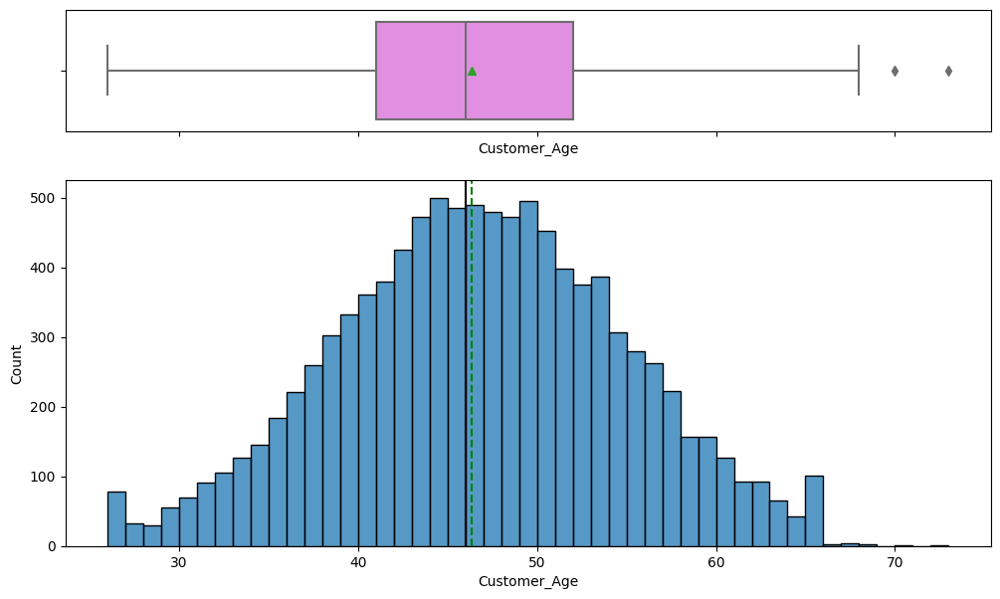

<IPython.core.display.Javascript object>

In [18]:
histogram_boxplot(data, "Customer_Age")

- The distribution looks normally distributed with a few outliers at the right tail
- We will not treat these points as they represent the industry trend. 

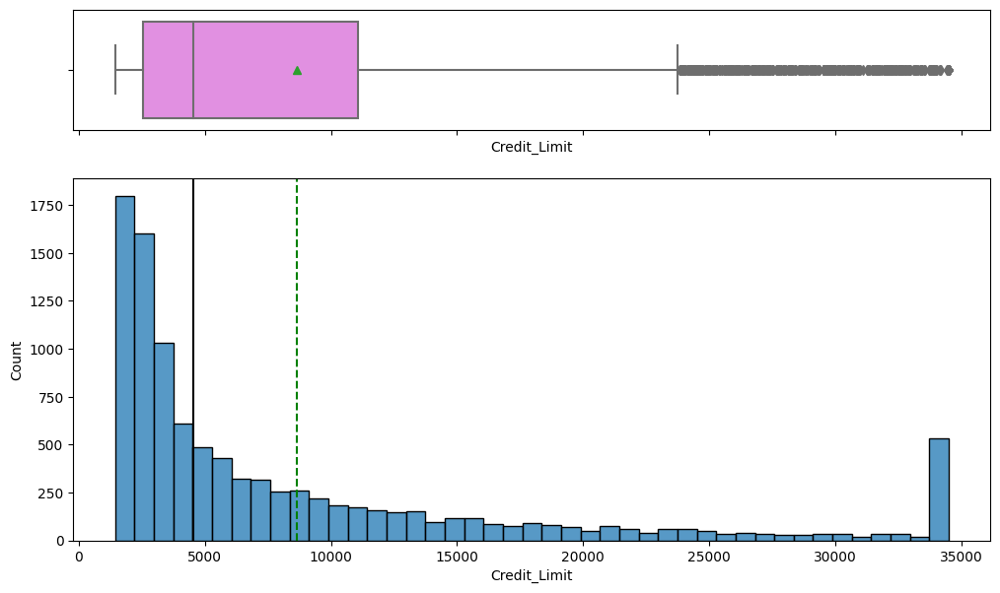

<IPython.core.display.Javascript object>

In [19]:
histogram_boxplot(data, "Credit_Limit")

- The distribution is right skewed with a slight rise surge at the right tail
- The boxplot shows outliers on the right end but these will not be treated as outliers as they represent real market trend.

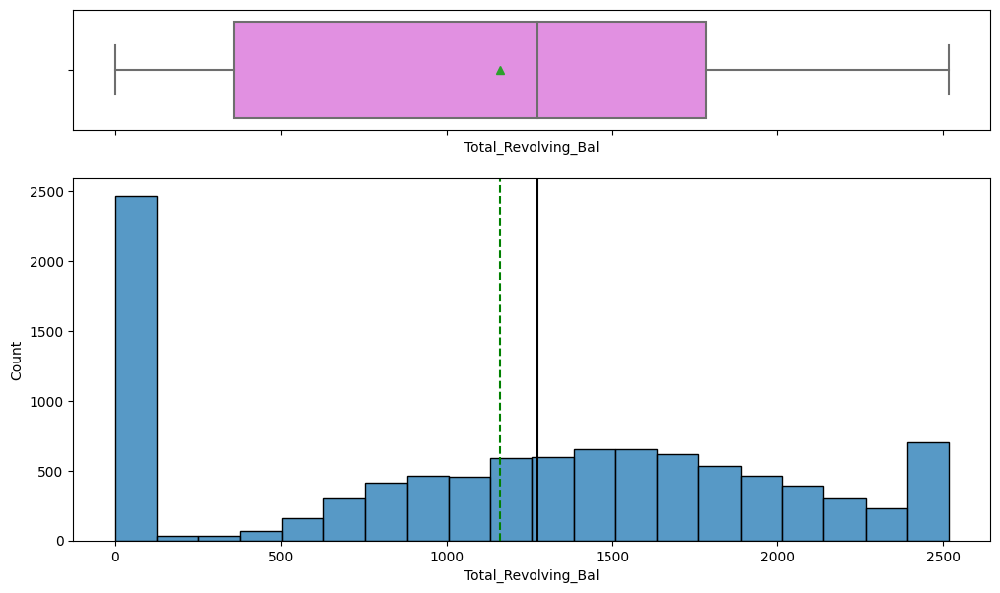

<IPython.core.display.Javascript object>

In [20]:
histogram_boxplot(data, "Total_Revolving_Bal")

- Majority of customers revolving balance is `0`
- The distribution represents real market trend.

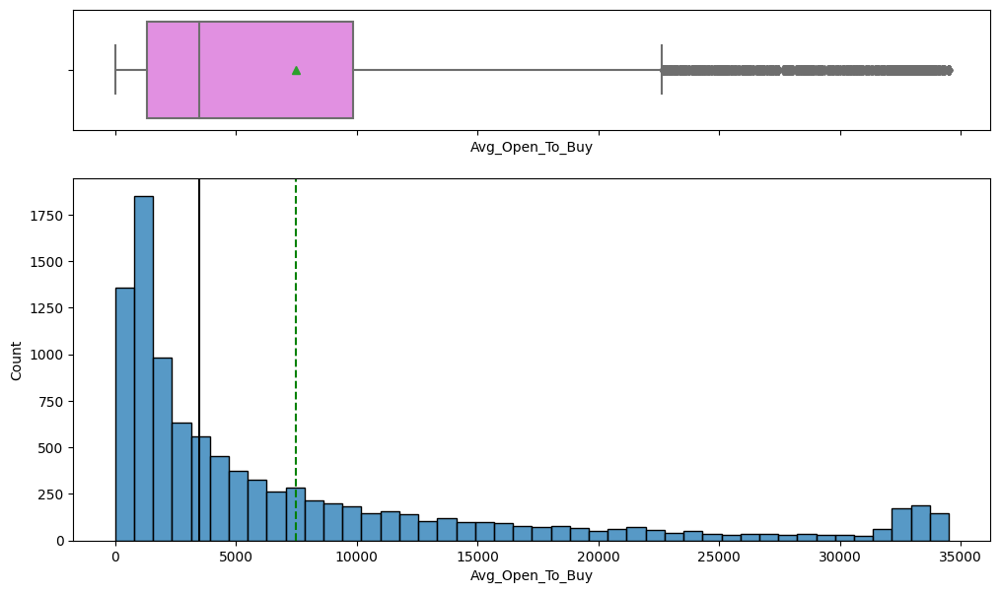

<IPython.core.display.Javascript object>

In [21]:
histogram_boxplot(data, "Avg_Open_To_Buy")

- The distribution is slightly similar to that of the credit limit with a right skew and slight rise at the right tail
- The boxplot similarly shows outliers on the right end
- These outliers will not be treated as they represent industry trend.

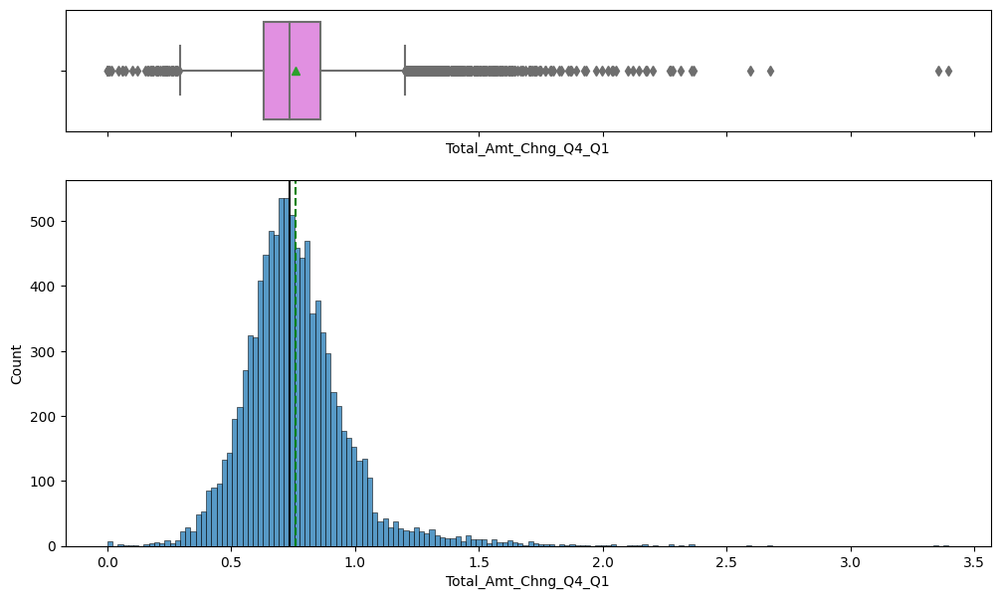

<IPython.core.display.Javascript object>

In [22]:
histogram_boxplot(data, "Total_Amt_Chng_Q4_Q1")

- The distribution is normal with a long right tail
- It represents industry trends and as such the outliers will not be treated.

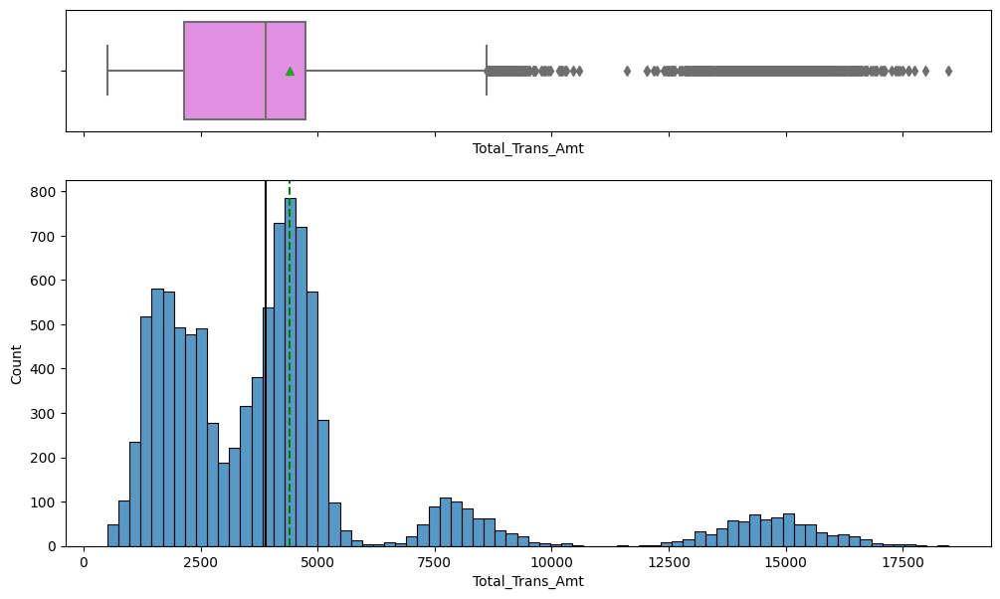

<IPython.core.display.Javascript object>

In [23]:
histogram_boxplot(data, "Total_Trans_Amt")

- The boxplot shows outliers on the right end
- The distribution is right skewed.

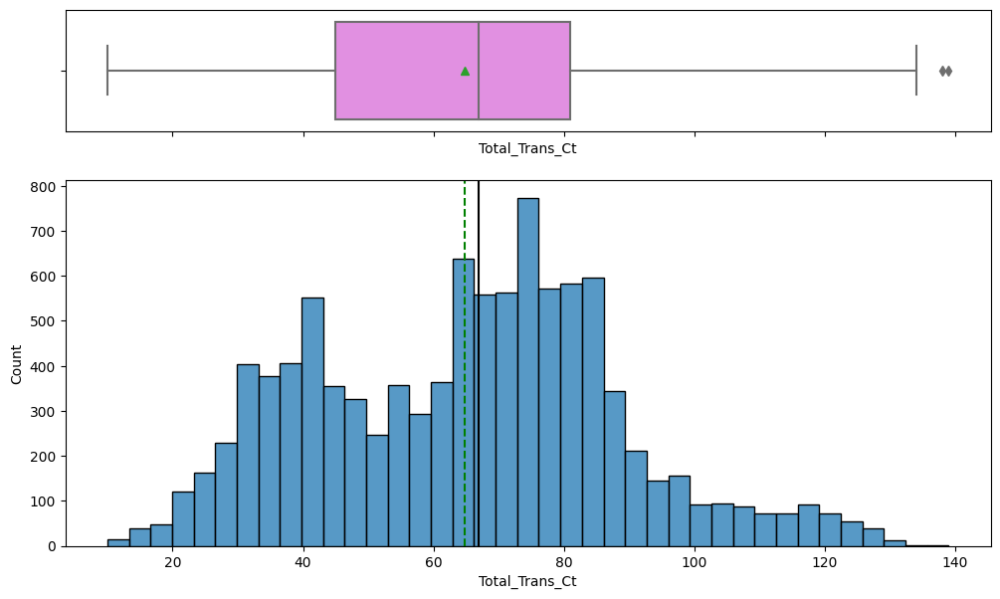

<IPython.core.display.Javascript object>

In [24]:
histogram_boxplot(data, "Total_Trans_Ct")

- The distribution looks fairly normally distributed
- The boxplot shows few outliers on the right end but these will not be treated as they represent real market trend.

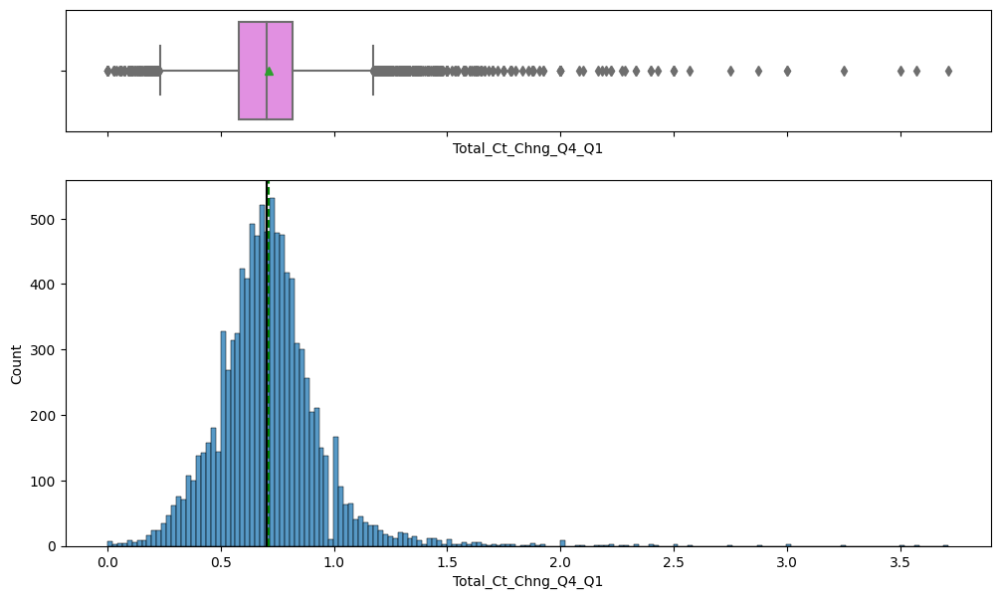

<IPython.core.display.Javascript object>

In [25]:
histogram_boxplot(data, "Total_Ct_Chng_Q4_Q1")

- Similar to 'Total_Amt_Chng_Q4_Q1' the ditribution looks normal with a long right tail
- The boxplot shows outliers on both sides
- It represents industry trends and as such the outliers will not be treated.

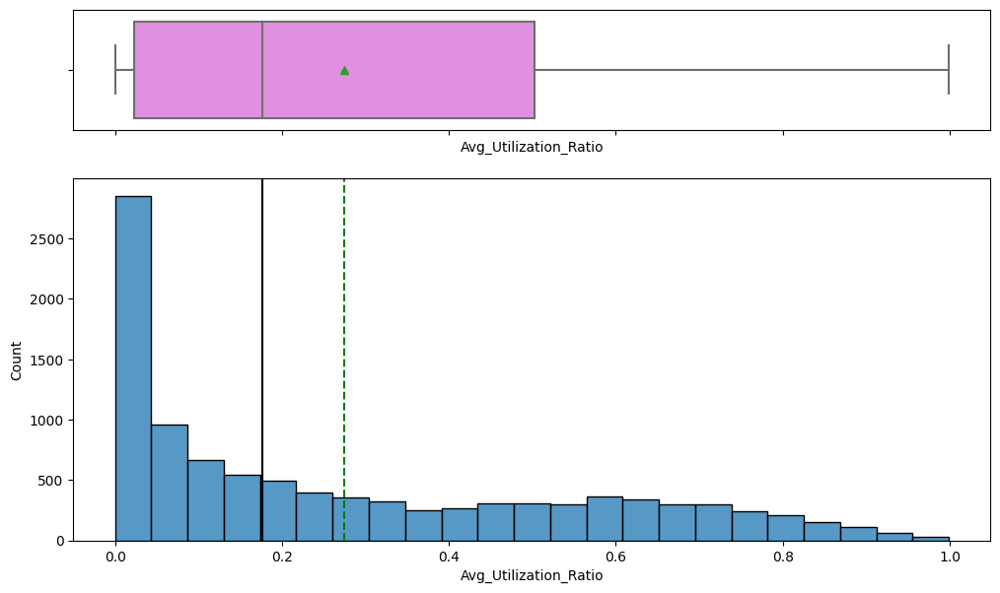

<IPython.core.display.Javascript object>

In [26]:
histogram_boxplot(data, "Avg_Utilization_Ratio")

- The distribution is right skewed.

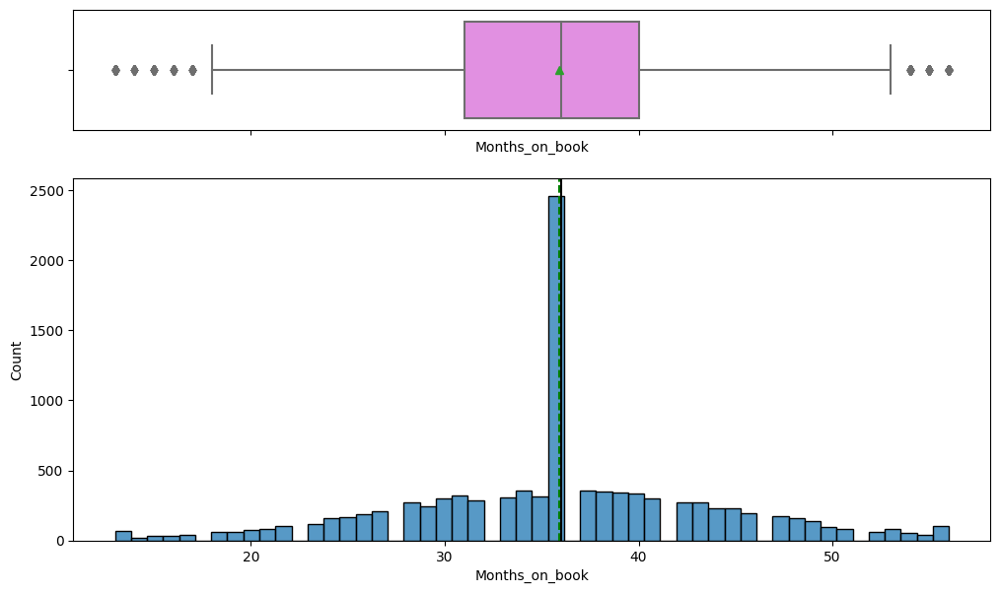

<IPython.core.display.Javascript object>

In [27]:
histogram_boxplot(data, "Months_on_book")

- The average period of relationship with the bank is approx `36 months`.

In [28]:
# We'll define a function to create barplots for the categorical variables indicating percentage of each category
# for that variable. color="dodgerblue"


def labeled_barplot(data, feature, perc=False, n=None):
    """
    Barplot with percentage at the top

    data: dataframe
    feature: dataframe column
    perc: whether to display percentages instead of count (default is False)
    n: displays the top n category levels (default is None, i.e., display all levels)
    """

    total = len(data[feature])  # length of the column
    count = data[feature].nunique()
    if n is None:
        plt.figure(figsize=(count + 1, 5))
    else:
        plt.figure(figsize=(n + 1, 5))

    plt.xticks(rotation=90, fontsize=15)
    ax = sns.countplot(
        data=data,
        x=feature,
        palette="YlOrRd",
        order=data[feature].value_counts().index[:n].sort_values(),
    )

    for p in ax.patches:
        if perc == True:
            label = "{:.1f}%".format(
                100 * p.get_height() / total
            )  # percentage of each class of the category
        else:
            label = p.get_height()  # count of each level of the category

        x = p.get_x() + p.get_width() / 2  # width of the plot
        y = p.get_height()  # height of the plot

        ax.annotate(
            label,
            (x, y),
            ha="center",
            va="center",
            size=12,
            xytext=(0, 5),
            textcoords="offset points",
        )  # annotate the percentage

    plt.show()  # show the plot

<IPython.core.display.Javascript object>

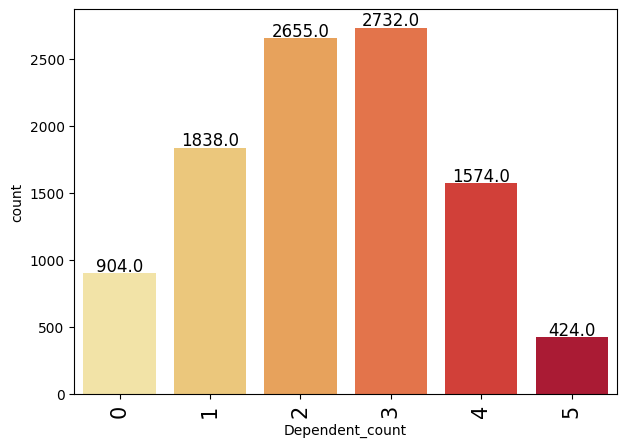

<IPython.core.display.Javascript object>

In [29]:
labeled_barplot(data, "Dependent_count")

- Majority of customers `53%` have `2-3` dependents
- Customers with 5 dependents are the least
- Customers with 2-3 dependents should be targeted more to increase customer base.

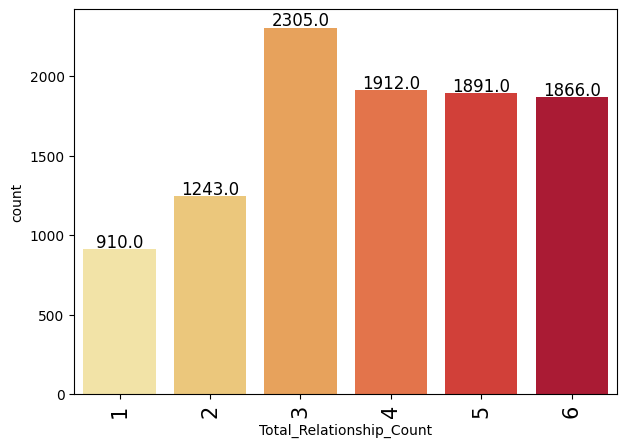

<IPython.core.display.Javascript object>

In [30]:
labeled_barplot(data, "Total_Relationship_Count")

- Approx `23%` of customers hold `3` products
- This is followed by customers who hols `4,5 & 6` products accordingly.

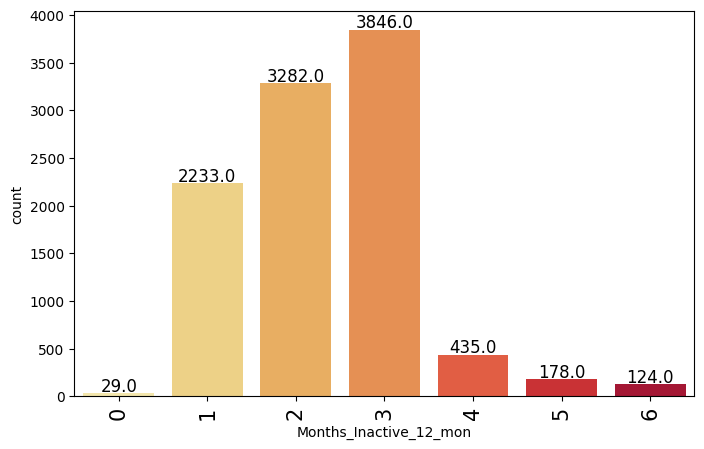

<IPython.core.display.Javascript object>

In [31]:
labeled_barplot(data, "Months_Inactive_12_mon")

- In the last 12 months, approx `38%` of customers were inactive for 3 months
- This is followed by `2 and 1` months of inactivity accordingly
- The least period of inactivity is `0` months; This may likely be new customers.

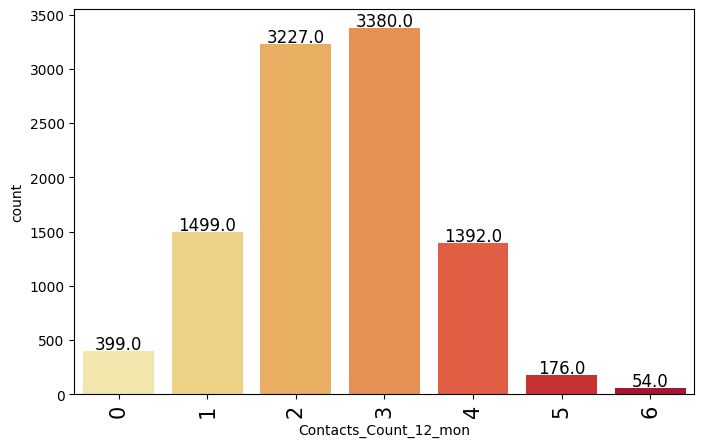

<IPython.core.display.Javascript object>

In [32]:
labeled_barplot(data, "Contacts_Count_12_mon")

- In the last 12 months, `65%` of customers were in contact with the bank `2-3` times with the latter being the most
- The least contact is `5-6` times with the latter being the least.

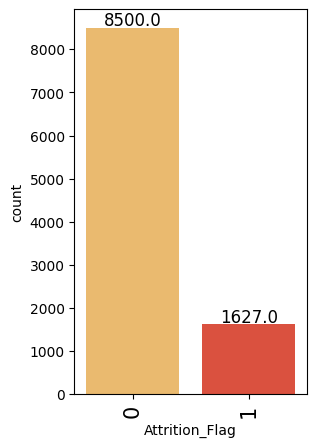

<IPython.core.display.Javascript object>

In [33]:
labeled_barplot(data, "Attrition_Flag")

- As seen, the class distribution in the target variable is imbalanced
- Approx `84%` of customers are existing customers, while `16%` are attrited. 

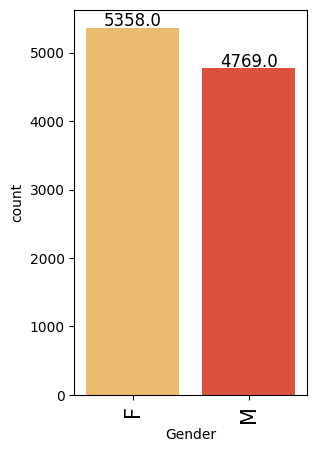

<IPython.core.display.Javascript object>

In [34]:
labeled_barplot(data, "Gender")

- More than half of the customers are female
- This could mean that female customers take more credit
- Females should be targeted more to increase customer base.

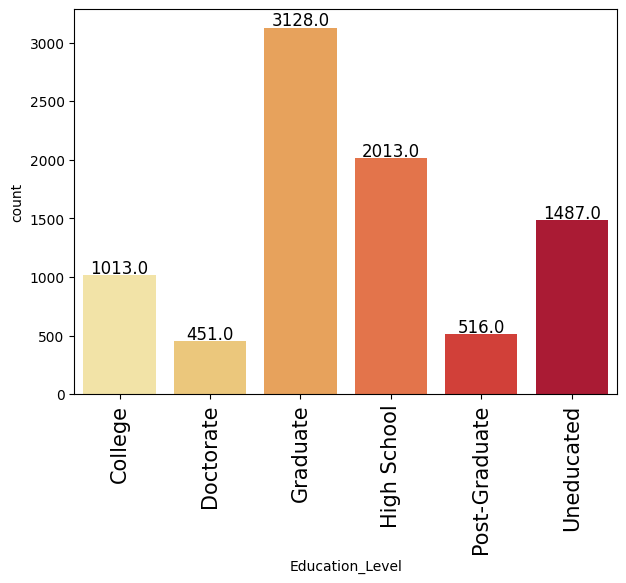

<IPython.core.display.Javascript object>

In [35]:
labeled_barplot(data, "Education_Level")

- Approx `31%` of customers are educated to a graduate level
- This is followed by customers with a high school degree and uneducated customers accordingly
- Very few customers are educated to a post-graduate & doctorate level
- Approx `15%` of the data is also missing. This will be treated before the modelling.

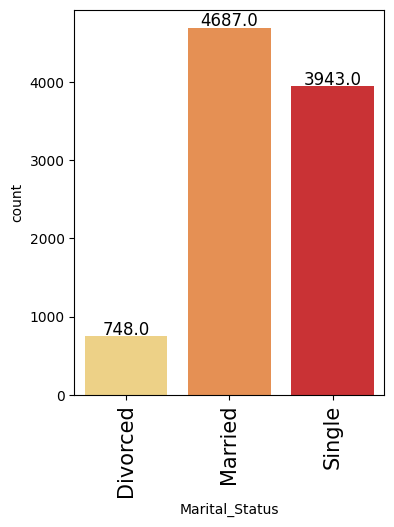

<IPython.core.display.Javascript object>

In [36]:
labeled_barplot(data, "Marital_Status")

- `46%` of customers are married
- This is followed by single customers at approx `39%` leaving divorced customers as the least
- Approx `7.4%` of the data is also missing. This will be treated before the modelling
- Married people can be targeted to increase customer base.

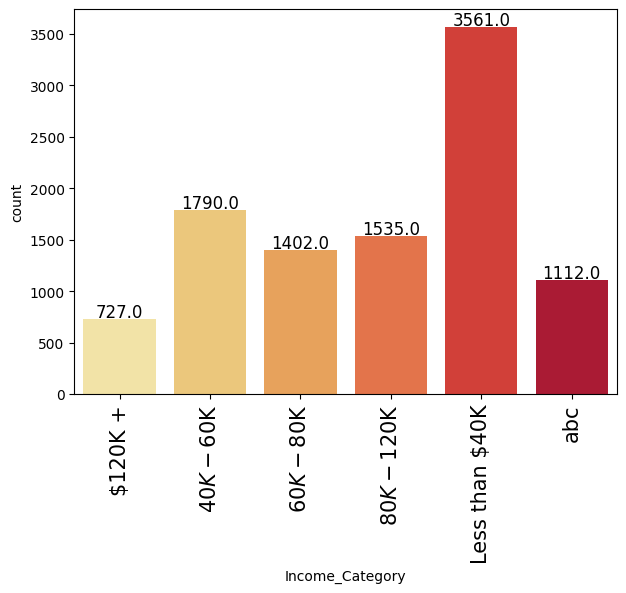

<IPython.core.display.Javascript object>

In [37]:
labeled_barplot(data, "Income_Category")

- `35%` of customers earn less than 40k. This aligns with real market trend as people with lesser income require more credit. This will further be explored
- Approx `11%` of the income category is an object `abc`. This isn't of usable value and will be treated as Nan and imputed before modelling
- People earning less than 40k should be targeted to increase customer base.

In [38]:
# We can merge the Income_Category -  'abc' and 'Less than $40K' together
data["Income_Category"].replace("abc", "Less than $40K", inplace=True)

<IPython.core.display.Javascript object>

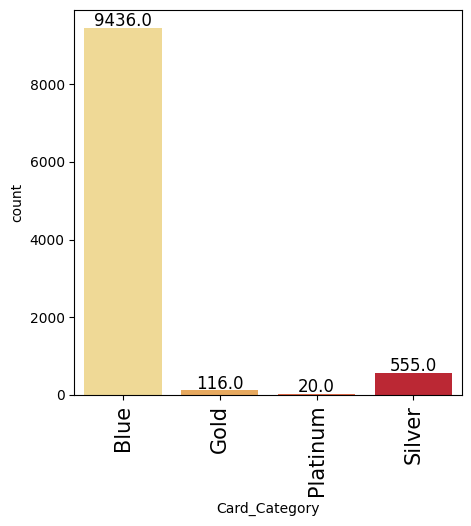

<IPython.core.display.Javascript object>

In [39]:
labeled_barplot(data, "Card_Category")

- `93%` of customers own a blue card
- Customers with a platinum card are the least. 

### Bivariate Analysis

<Axes: >

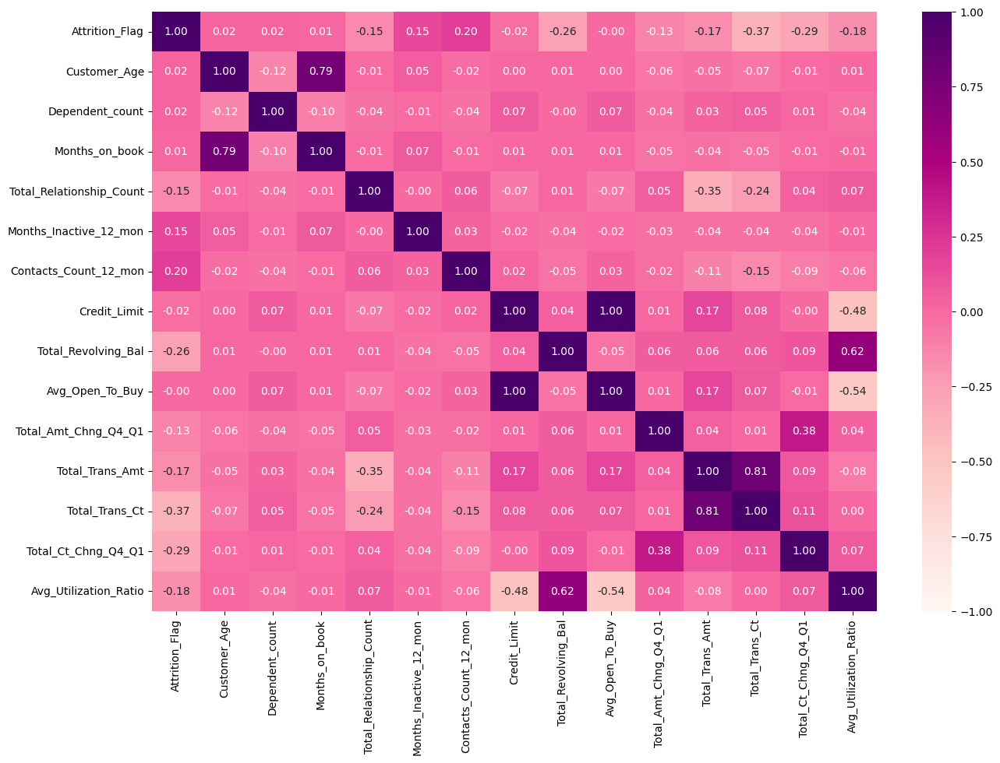

<IPython.core.display.Javascript object>

In [40]:
data.corr()
plt.figure(figsize=(15, 10))
sns.heatmap(data.corr(), annot=True, vmin=-1, vmax=1, fmt=".2f", cmap="RdPu")

- Months_on_book is highly correlated with customer_age
- Total_trans_amt has a weak negative correlation with total_relationship_count
- Avg_utilization_ratio has a fairly average negative correlation with credit_limit
- Avg_utilization_ratio has a moderate positve correlation with total_revolving_bal
- Avg_utilization_ratio has an average negative correlation with avg_open_to_buy
- Total_ct_chng_q4_q1 has a weak postive correlation with Total_amt_chng_q4_q1
- These relationships will be explored further.

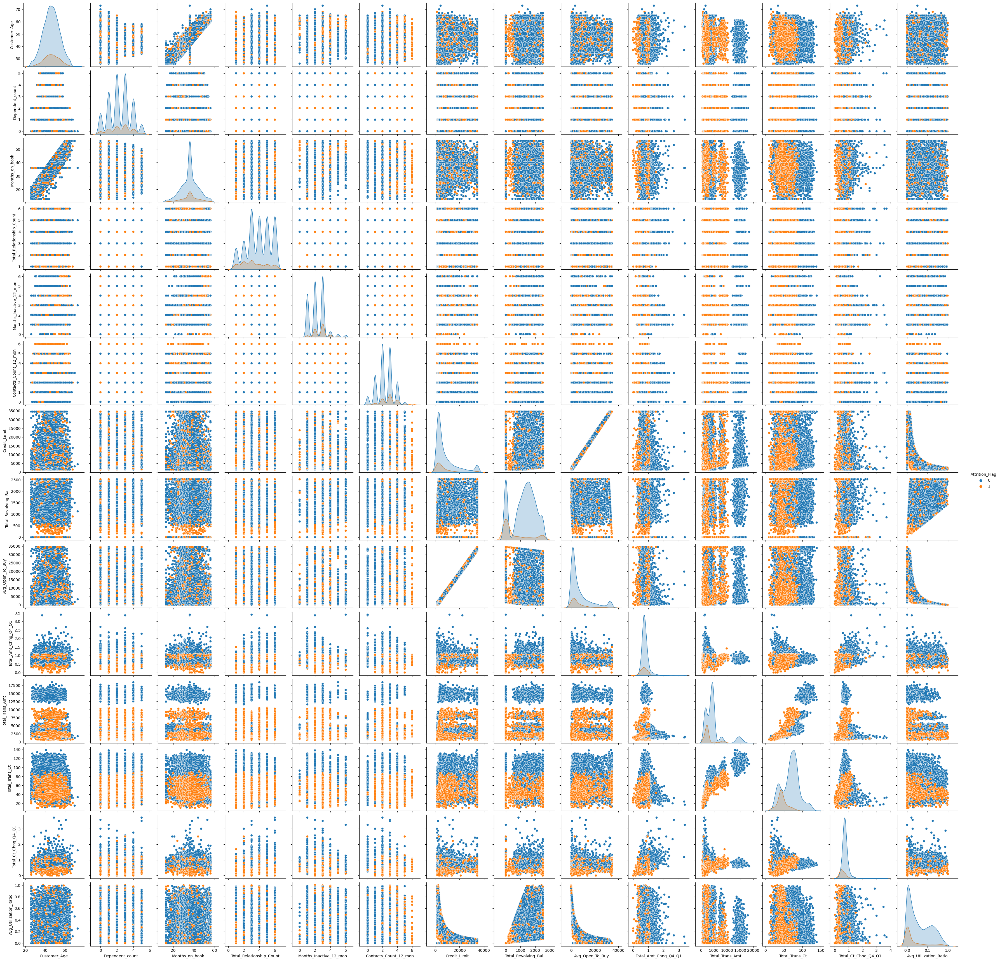

<IPython.core.display.Javascript object>

In [41]:
sns.pairplot(data, hue="Attrition_Flag")

- There are overlaps i.e. no clear distinction in the distribution of variables for attrited & existing customers 
- Let's explore this further with the help of other plots.

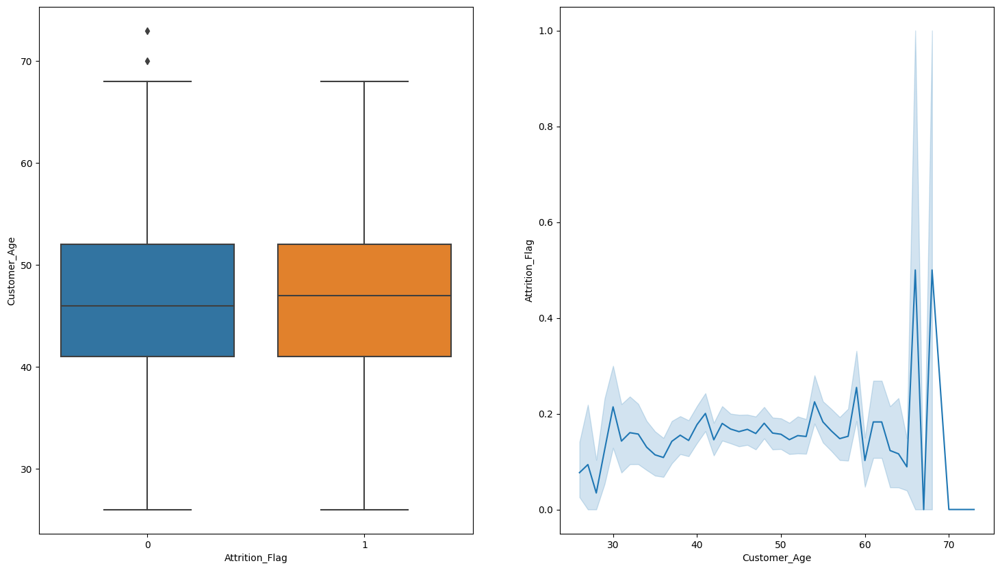

<IPython.core.display.Javascript object>

In [42]:
fig, axes = plt.subplots(1, 2, figsize=(18, 10))

sns.boxplot(
    ax=axes[0], x="Attrition_Flag", y="Customer_Age", data=data, orient="vertical"
)
sns.lineplot(
    ax=axes[1], x="Customer_Age", y="Attrition_Flag", palette="viridis", data=data
)
plt.show()

- The median age of attrited customers is slightly more than the existing customers
- There is a likelihood of churning across all ages although older customers(`> 65`) are more likely to churn. 
- This could be that they are people taking advantage of the credit company or they are financially stable and no longer in need on credit. This will be explored further
- There are outliers in boxplots of the existing customers.

<Axes: xlabel='Attrition_Flag', ylabel='Total_Relationship_Count'>

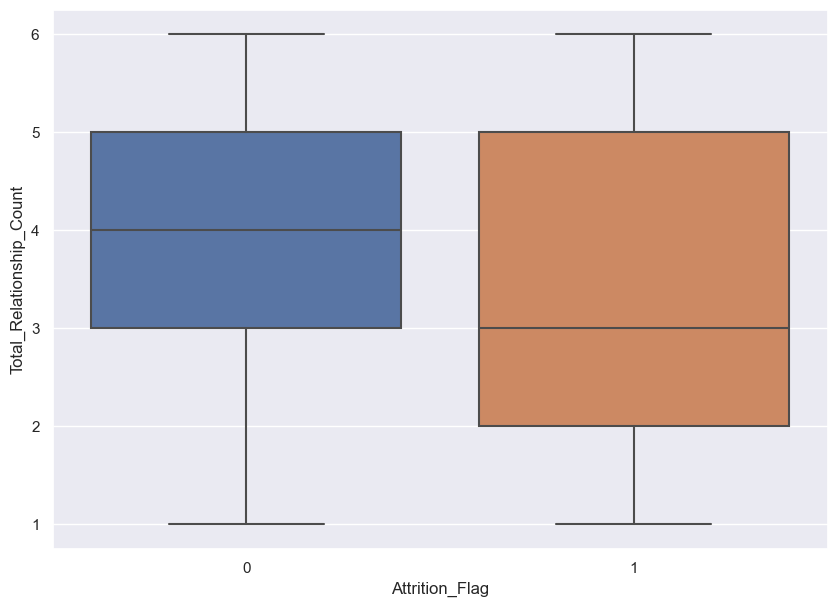

<IPython.core.display.Javascript object>

In [43]:
sns.set(rc={"figure.figsize": (10, 7)})
sns.boxplot(
    x="Attrition_Flag", y="Total_Relationship_Count", data=data, orient="vertical"
)

- Attrited customers hold less products on average than existing customers
- This shows that customers that hold less products are more likely to close their account
- This could be that they have no interest in long term banking and are trying to dupe the company.

<Axes: xlabel='Attrition_Flag', ylabel='Credit_Limit'>

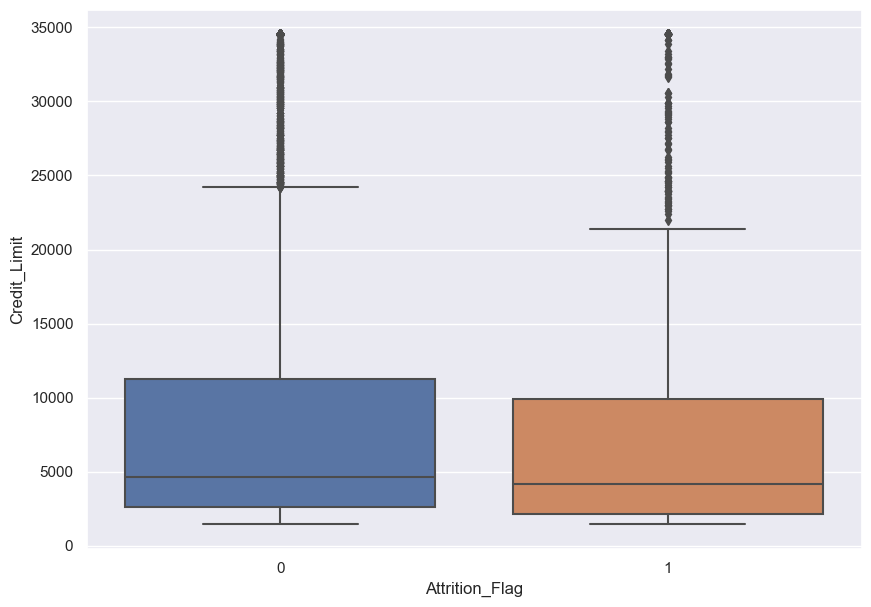

<IPython.core.display.Javascript object>

In [44]:
sns.set(rc={"figure.figsize": (10, 7)})
sns.boxplot(x="Attrition_Flag", y="Credit_Limit", data=data, orient="vertical")

- On average attrited customers have a lower credit limit
- This shows that customers that have low credit are more likely to churn
- The boxplot shows outliers for both classes of customers.

<Axes: xlabel='Attrition_Flag', ylabel='Total_Revolving_Bal'>

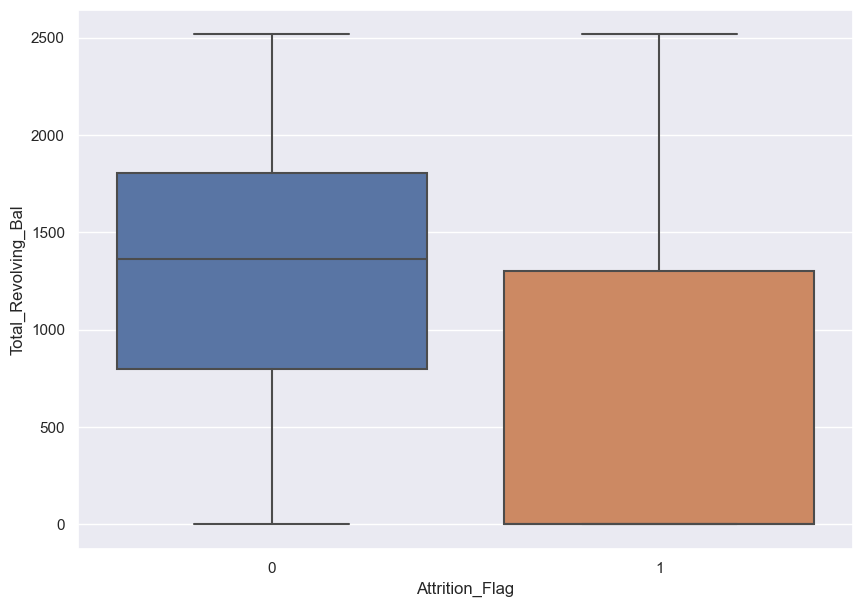

<IPython.core.display.Javascript object>

In [45]:
sns.set(rc={"figure.figsize": (10, 7)})
sns.boxplot(x="Attrition_Flag", y="Total_Revolving_Bal", data=data, orient="vertical")

- Attrited customers tend to have a low revolving balance in comparison to existing customers
- This shows that customers with a low revolving balance are more likely to churn.

<Axes: xlabel='Attrition_Flag', ylabel='Total_Amt_Chng_Q4_Q1'>

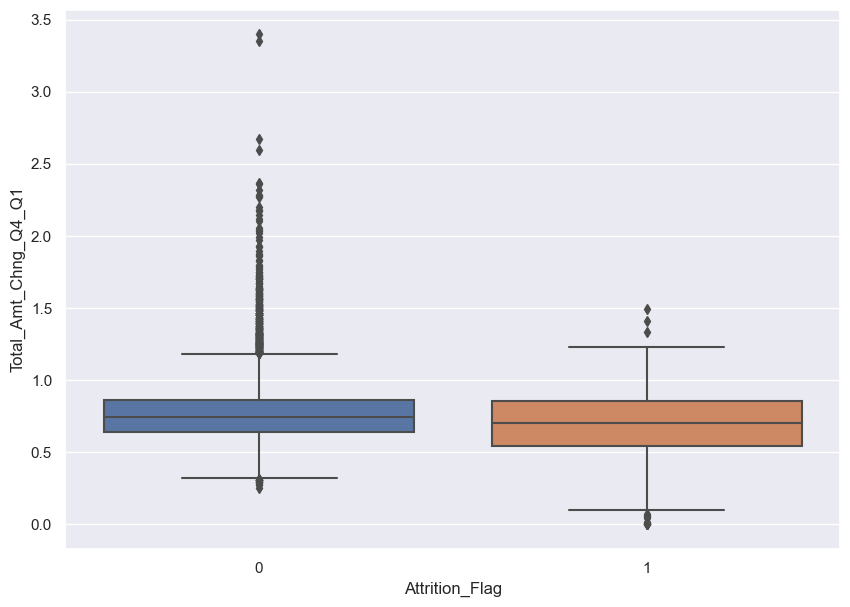

<IPython.core.display.Javascript object>

In [46]:
sns.set(rc={"figure.figsize": (10, 7)})
sns.boxplot(x="Attrition_Flag", y="Total_Amt_Chng_Q4_Q1", data=data, orient="vertical")

- Attrited customers have a low Total_Amt_Chng_Q4_Q1 on average as compared to existing customers
- This could be that they make transactions with low amounts in general as compared to existing customers
- The boxplot shows outliers for both classes of customers.

<Axes: xlabel='Attrition_Flag', ylabel='Total_Trans_Amt'>

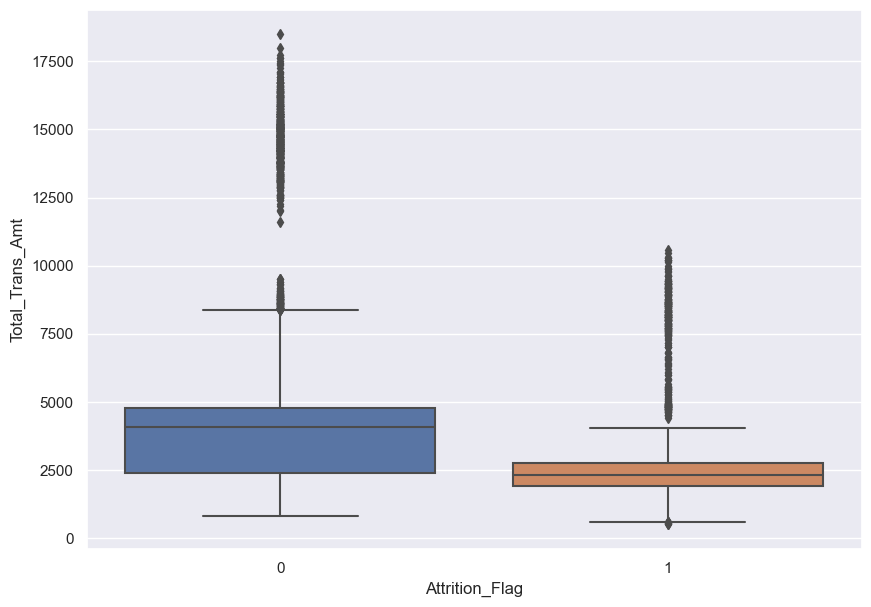

<IPython.core.display.Javascript object>

In [47]:
sns.set(rc={"figure.figsize": (10, 7)})
sns.boxplot(x="Attrition_Flag", y="Total_Trans_Amt", data=data, orient="vertical")

- As presumed, attrited customers on average made transactions with low amounts in the last 12 months as compared to existing customers
- This shows that customers with low transaction amounts are more likely to close their account
- The boxplot shows outliers in both classes of customers.

<Axes: xlabel='Attrition_Flag', ylabel='Total_Trans_Ct'>

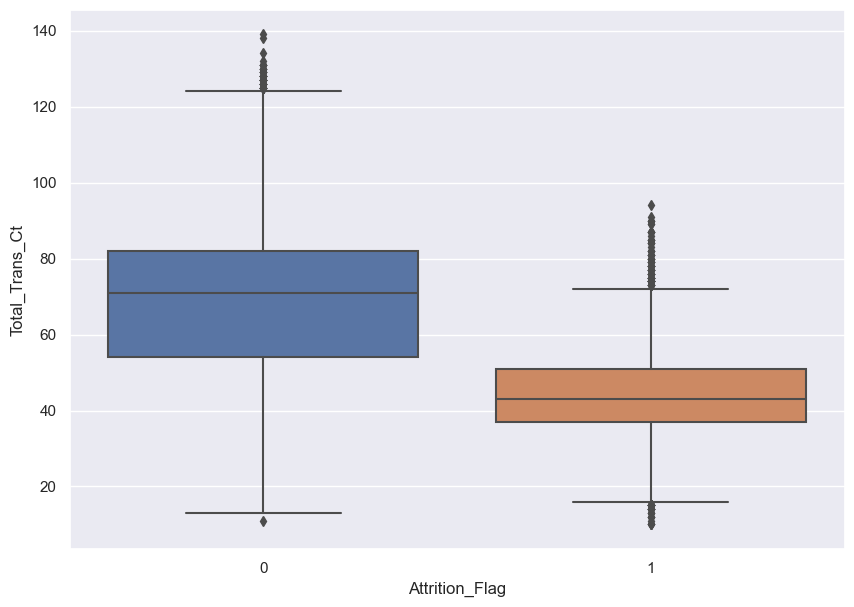

<IPython.core.display.Javascript object>

In [48]:
sns.set(rc={"figure.figsize": (10, 7)})
sns.boxplot(x="Attrition_Flag", y="Total_Trans_Ct", data=data, orient="vertical")

- As assumed, attrited customers on average made less transactions in the last 12 months as compared to existing customers
- This shows that customers with low transaction count are more likely to close their account
- The boxplot shows outliers in both classes of customers.

<Axes: xlabel='Attrition_Flag', ylabel='Total_Ct_Chng_Q4_Q1'>

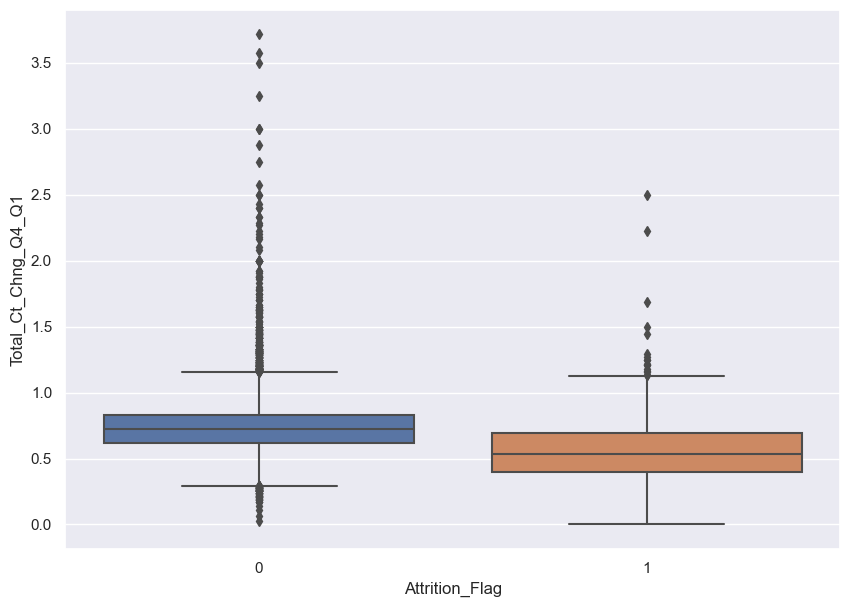

<IPython.core.display.Javascript object>

In [49]:
sns.set(rc={"figure.figsize": (10, 7)})
sns.boxplot(x="Attrition_Flag", y="Total_Ct_Chng_Q4_Q1", data=data, orient="vertical")

- Attrited customers have a low Total_Ct_Chng_Q4_Q1 on average as compared to existing customers
- This could be that they make transactions less transactions in general as compared to existing customers
- This shows that customers with a low Total_Ct_Chng_Q4_Q1 are more likely to churn
- The boxplot shows outliers for both classes of customers.

<Axes: xlabel='Attrition_Flag', ylabel='Avg_Utilization_Ratio'>

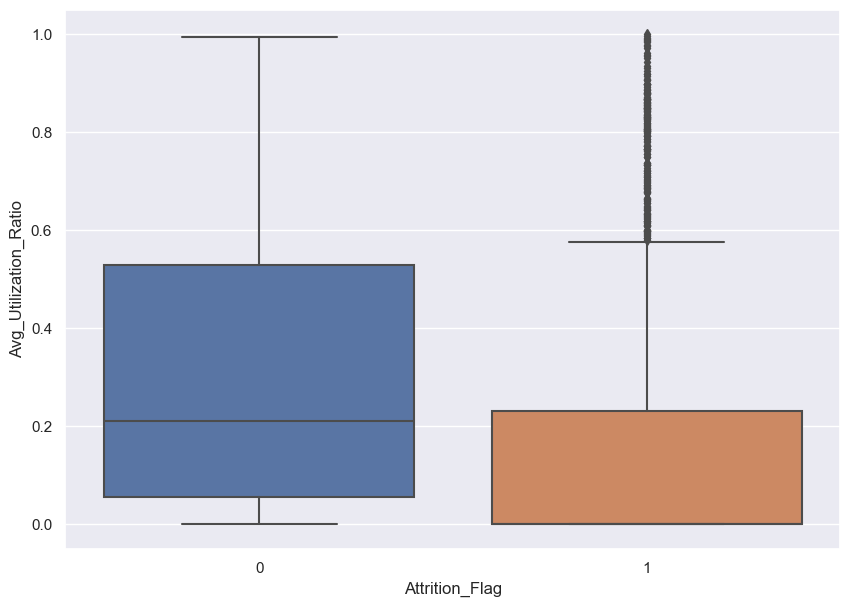

<IPython.core.display.Javascript object>

In [50]:
sns.set(rc={"figure.figsize": (10, 7)})
sns.boxplot(x="Attrition_Flag", y="Avg_Utilization_Ratio", data=data, orient="vertical")

- Attrited customers have a low Avg_Utilization_Ratio on average as compared to existing customers
- This shows that customers with a low Avg_Utilization_Ratio are more likely to churn
- This could be that they have a low revolving balance as compared to their credit limit
- The boxplot shows outliers for the attrited customers.

In [51]:
# function to plot stacked bar chart


def stacked_barplot(data, predictor, target):
    """
    Print the category counts and plot a stacked bar chart

    data: dataframe
    predictor: independent variable
    target: target variable
    """
    count = data[predictor].nunique()
    sorter = data[target].value_counts().index[-1]
    sns.set(palette="RdBu")
    tab1 = pd.crosstab(data[predictor], data[target], margins=True).sort_values(
        by=sorter, ascending=False
    )
    print(tab1)
    print("-" * 120)
    tab = pd.crosstab(data[predictor], data[target], normalize="index").sort_values(
        by=sorter, ascending=False
    )
    tab.plot(kind="bar", stacked=True, figsize=(count + 1, 5))
    plt.legend(
        loc="lower left",
        frameon=False,
    )
    plt.legend(loc="upper left", bbox_to_anchor=(1, 1))
    plt.show()

<IPython.core.display.Javascript object>

Attrition_Flag     0     1    All
Gender                           
All             8500  1627  10127
F               4428   930   5358
M               4072   697   4769
------------------------------------------------------------------------------------------------------------------------


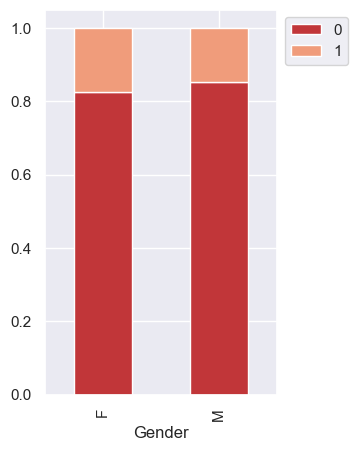

<IPython.core.display.Javascript object>

In [52]:
stacked_barplot(data, "Gender", "Attrition_Flag")

- As can be seen female customers are more likely to churn than male customers.

Attrition_Flag      0     1   All
Education_Level                  
All              7237  1371  8608
Graduate         2641   487  3128
High School      1707   306  2013
Uneducated       1250   237  1487
College           859   154  1013
Doctorate         356    95   451
Post-Graduate     424    92   516
------------------------------------------------------------------------------------------------------------------------


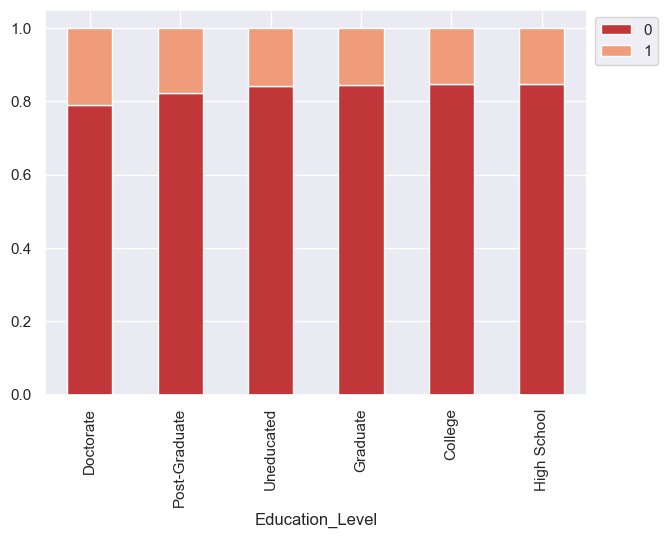

<IPython.core.display.Javascript object>

In [53]:
stacked_barplot(data, "Education_Level", "Attrition_Flag")

- Customers educated to a doctorate level are more likely to churn
- This is followed by customers with a post-graduate degree.

Attrition_Flag     0     1   All
Marital_Status                  
All             7880  1498  9378
Married         3978   709  4687
Single          3275   668  3943
Divorced         627   121   748
------------------------------------------------------------------------------------------------------------------------


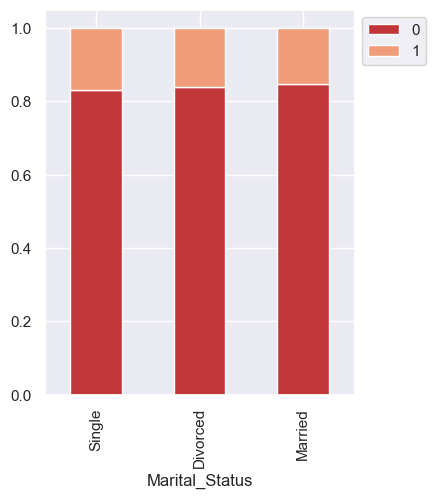

<IPython.core.display.Javascript object>

In [54]:
stacked_barplot(data, "Marital_Status", "Attrition_Flag")

- Single customers tend to be the most likely to churn
- This is followed by divorced people.

Attrition_Flag      0     1    All
Income_Category                   
All              8500  1627  10127
Less than $40K   3874   799   4673
$40K - $60K      1519   271   1790
$80K - $120K     1293   242   1535
$60K - $80K      1213   189   1402
$120K +           601   126    727
------------------------------------------------------------------------------------------------------------------------


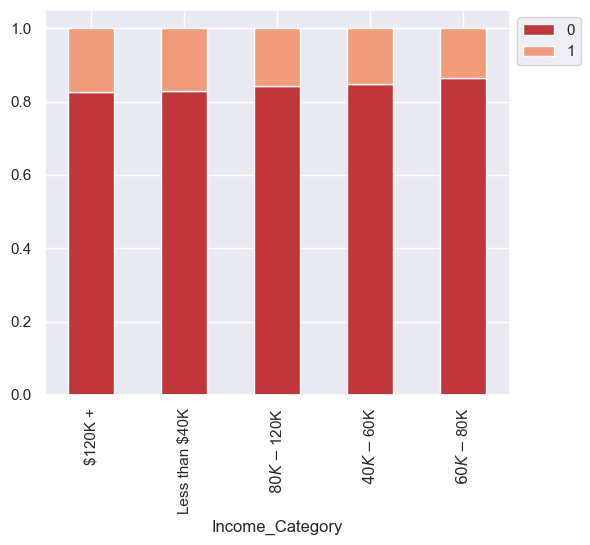

<IPython.core.display.Javascript object>

In [55]:
stacked_barplot(data, "Income_Category", "Attrition_Flag")

- Customers who earn `less than 40k & 120k+` are more likely to churn
- For `less than 40k` earners it might be that they can't keep up with the interest rates
- For `120k +` earners it might be that they feel they no longer require credit.

Attrition_Flag     0     1    All
Card_Category                    
All             8500  1627  10127
Blue            7917  1519   9436
Silver           473    82    555
Gold              95    21    116
Platinum          15     5     20
------------------------------------------------------------------------------------------------------------------------


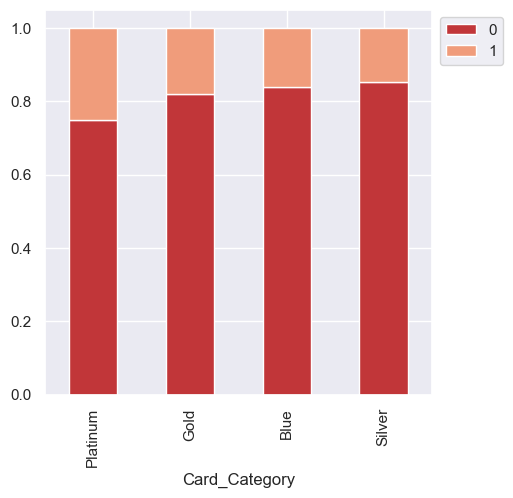

<IPython.core.display.Javascript object>

In [56]:
stacked_barplot(data, "Card_Category", "Attrition_Flag")

- Customers with a platinum card are more likely to churn.

In [57]:
# Data description of churners
data[data["Attrition_Flag"] == 1].describe(include="all").T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
Attrition_Flag,1627.000,NaN,NaN,NaN,1.000,0.000,1.000,1.000,1.000,1.000,1.000
Customer_Age,1627.000,NaN,NaN,NaN,46.659,7.666,26.000,41.000,47.000,52.000,68.000
Gender,1627,2,F,930,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Dependent_count,1627.000,NaN,NaN,NaN,2.403,1.275,0.000,2.000,2.000,3.000,5.000
Education_Level,1371,6,Graduate,487,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Marital_Status,1498,3,Married,709,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Income_Category,1627,5,Less than $40K,799,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Card_Category,1627,4,Blue,1519,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Months_on_book,1627.000,NaN,NaN,NaN,36.178,7.797,13.000,32.000,36.000,40.000,56.000
Total_Relationship_Count,1627.000,NaN,NaN,NaN,3.280,1.578,1.000,2.000,3.000,5.000,6.000


<IPython.core.display.Javascript object>

**Churner Description**
- Average age of churners is `46`
- More than `50%` of churners are female
- The average dependent count of churners is `2`
- Most churners are `graduates`
- `Married` people make up most of the churners
- `49%` of churners earn `less than 40k`
- Approx `93%` of churners have a `blue` card
- The average product held by a churner is `3`
- In the last 12 months churners were inactive for an average of `2` months
- In the last 12 months churners had approx `3` contacts with the bank on average
- The average credit limit of churners was approx `8100`
- The average revolving balance of churners was approx `670`
- The average Avg_Open_To_Buy for churners was approx `7400`
- The average Total_Amt_Chng_Q4_Q1 for churners was approx `0.69`
- The average Total_Trans_Amt for churners was approx `3090`
- The average Total_Trans_Ct for churners was approx `45`
- The average Total_Ct_Chng_Q4_Q1 for churners was approx `0.55`
- The average Avg_Utilization_Ratio for churners was approx `0.16`.

### Data Preparation for Modeling

### Split Data

In [58]:
df = data.copy()

<IPython.core.display.Javascript object>

### Missing-Value Treatment

* We will use mode to impute missing values in Education level and Marital status columns.

In [59]:
# Let's impute the missing values
imp_mode = SimpleImputer(strategy="most_frequent")

# fit the imputer on train data and transform the train data
df["Education_Level"] = imp_mode.fit_transform(df[["Education_Level"]])
df["Marital_Status"] = imp_mode.fit_transform(df[["Marital_Status"]])

<IPython.core.display.Javascript object>

In [60]:
X = df.drop(["Attrition_Flag"], axis=1)
X = pd.get_dummies(X, drop_first=True)

y = df["Attrition_Flag"]

<IPython.core.display.Javascript object>

In [61]:
# Splitting data into training, validation and test sets:
# first we split data into 2 parts, say temporary and test

X_temp, X_test, y_temp, y_test = train_test_split(
    X, y, test_size=0.2, random_state=1, stratify=y
)

# then we split the temporary set into train and validation

X_train, X_val, y_train, y_val = train_test_split(
    X_temp, y_temp, test_size=0.25, random_state=1, stratify=y_temp
)
print(X_train.shape, X_val.shape, X_test.shape)

(6075, 29) (2026, 29) (2026, 29)


<IPython.core.display.Javascript object>

### Model evaluation criterion

### We will be using Recall as a metric for our model performance because here company could face 2 types of losses
1. Predicting a customer will not churn and the customer churns - Loss of business/profit
2. Predicting a customer will churn and the customer doesn't churn 

### Which Loss is greater? 
* Predicting a customer will not churn and the customer churns. 

### How to reduce this loss i.e need to reduce False Negatives?
* Company wants recall to be maximized i.e. we need to reduce the number of false negatives.

In [62]:
models = []  # Empty list to store all the models

# Appending models into the list
models.append(("Bagging", BaggingClassifier(random_state=1)))
models.append(("Random forest", RandomForestClassifier(random_state=1)))
models.append(("GBM", GradientBoostingClassifier(random_state=1)))
models.append(("Adaboost", AdaBoostClassifier(random_state=1)))
models.append(("Xgboost", XGBClassifier(random_state=1, eval_metric="logloss")))
models.append(("dtree", DecisionTreeClassifier(random_state=1)))

results = []  # Empty list to store all model's CV scores
names = []  # Empty list to store name of the models
score = []
# loop through all models to get the mean cross validated score
print("\n" "Cross-Validation Performance:" "\n")
for name, model in models:
    scoring = "recall"
    kfold = StratifiedKFold(
        n_splits=5, shuffle=True, random_state=1
    )  # Setting number of splits equal to 5
    cv_result = cross_val_score(
        estimator=model, X=X_train, y=y_train, scoring=scoring, cv=kfold
    )
    results.append(cv_result)
    names.append(name)
    print("{}: {}".format(name, cv_result.mean() * 100))

print("\n" "Validation Performance:" "\n")

for name, model in models:
    model.fit(X_train, y_train)
    scores = recall_score(y_val, model.predict(X_val))
    score.append(scores)
    print("{}: {}".format(name, scores))


Cross-Validation Performance:

Bagging: 78.58451072736787
Random forest: 75.30507587650445
GBM: 81.24646781789639
Adaboost: 82.16745159602303
Xgboost: 86.78126635269493
dtree: 78.0727367870225

Validation Performance:

Bagging: 0.8128834355828221
Random forest: 0.7975460122699386
GBM: 0.8558282208588958
Adaboost: 0.852760736196319
Xgboost: 0.8834355828220859
dtree: 0.8159509202453987


<IPython.core.display.Javascript object>

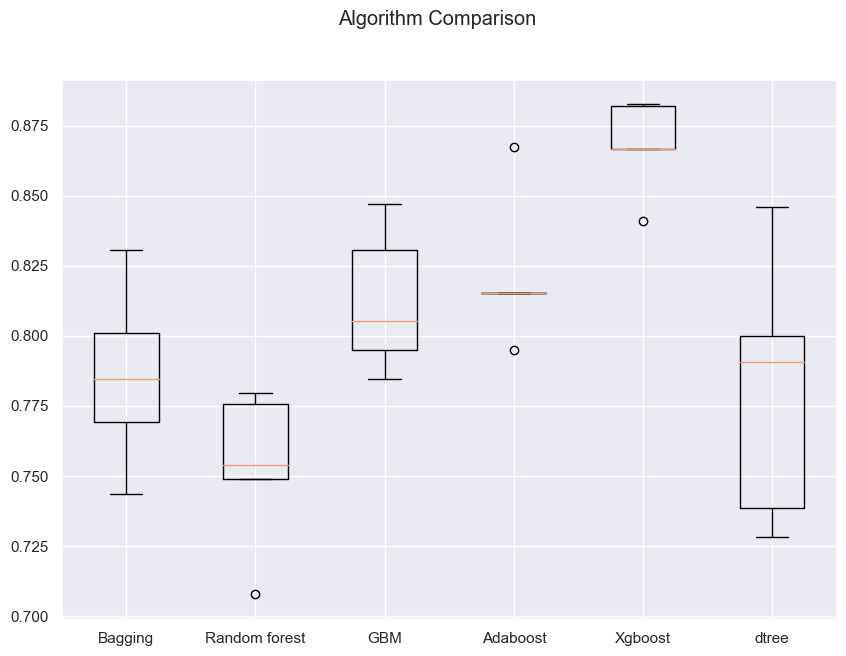

<IPython.core.display.Javascript object>

In [63]:
# Plotting boxplots for CV scores of all models defined above
fig = plt.figure()

fig.suptitle("Algorithm Comparison")
ax = fig.add_subplot(111)

plt.boxplot(results)
ax.set_xticklabels(names)

plt.show()

- We can see that the Xgboost is giving the highest cross-validated recall followed by adaboost
- The boxplot shows that the performance of xgboost & adaboost is consistent and their performance on the validation set is also good
- We will try these 6 models on oversampled data to evaluate their performance.

### Oversampling train data using SMOTE

In [64]:
print("Before UpSampling, counts of label 'Yes': {}".format(sum(y_train == 1)))
print("Before UpSampling, counts of label 'No': {} \n".format(sum(y_train == 0)))

sm = SMOTE(
    sampling_strategy=1, k_neighbors=5, random_state=1
)  # Synthetic Minority Over Sampling Technique
X_train_over, y_train_over = sm.fit_resample(X_train, y_train)


print("After UpSampling, counts of label 'Yes': {}".format(sum(y_train_over == 1)))
print("After UpSampling, counts of label 'No': {} \n".format(sum(y_train_over == 0)))


print("After UpSampling, the shape of train_X: {}".format(X_train_over.shape))
print("After UpSampling, the shape of train_y: {} \n".format(y_train_over.shape))

Before UpSampling, counts of label 'Yes': 976
Before UpSampling, counts of label 'No': 5099 

After UpSampling, counts of label 'Yes': 5099
After UpSampling, counts of label 'No': 5099 

After UpSampling, the shape of train_X: (10198, 29)
After UpSampling, the shape of train_y: (10198,) 



<IPython.core.display.Javascript object>

In [65]:
models = []  # Empty list to store all the models

# Appending models into the list
models.append(("Bagging", BaggingClassifier(random_state=1)))
models.append(("Random forest", RandomForestClassifier(random_state=1)))
models.append(("GBM", GradientBoostingClassifier(random_state=1)))
models.append(("Adaboost", AdaBoostClassifier(random_state=1)))
models.append(("Xgboost", XGBClassifier(random_state=1, eval_metric="logloss")))
models.append(("dtree", DecisionTreeClassifier(random_state=1)))

results = []  # Empty list to store all model's CV scores
names = []  # Empty list to store name of the models
score = []
# loop through all models to get the mean cross validated score
print("\n" "Cross-Validation Performance:" "\n")
for name, model in models:
    scoring = "recall"
    kfold = StratifiedKFold(
        n_splits=5, shuffle=True, random_state=1
    )  # Setting number of splits equal to 5
    cv_result = cross_val_score(
        estimator=model, X=X_train_over, y=y_train_over, scoring=scoring, cv=kfold
    )
    results.append(cv_result)
    names.append(name)
    print("{}: {}".format(name, cv_result.mean() * 100))

print("\n" "Validation Performance:" "\n")

for name, model in models:
    model.fit(X_train_over, y_train_over)
    scores = recall_score(y_val, model.predict(X_val))
    score.append(scores)
    print("{}: {}".format(name, scores))


Cross-Validation Performance:

Bagging: 96.33275606611633
Random forest: 97.97993034308915
GBM: 97.13667763474379
Adaboost: 96.41109122746252
Xgboost: 98.39179126017434
dtree: 95.23442821682157

Validation Performance:

Bagging: 0.8496932515337423
Random forest: 0.8680981595092024
GBM: 0.8926380368098159
Adaboost: 0.901840490797546
Xgboost: 0.8987730061349694
dtree: 0.8251533742331288


<IPython.core.display.Javascript object>

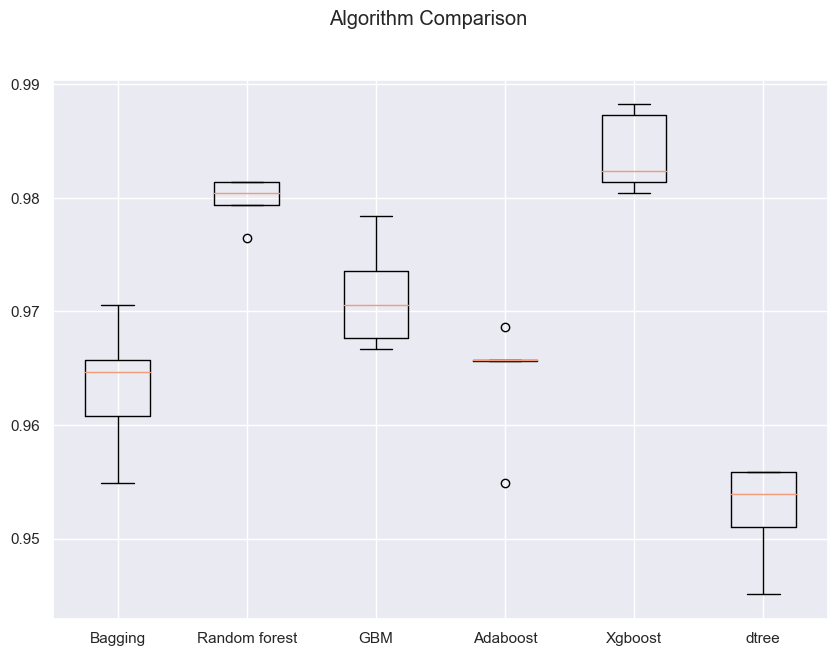

<IPython.core.display.Javascript object>

In [66]:
# Plotting boxplots for CV scores of all models defined above
fig = plt.figure()

fig.suptitle("Algorithm Comparison")
ax = fig.add_subplot(111)

plt.boxplot(results)
ax.set_xticklabels(names)

plt.show()

- We can see that the Xgboost is giving the highest cross-validated recall followed by random forest
- The boxplot shows that the performance of xgboost & random forest is consistent and their performance on the validation set is also good
- We will try these 6 models on undersampled data to evaluate their performance.

### Undersampling train data using RandomUnderSampler

In [67]:
rus = RandomUnderSampler(random_state=1)
X_train_un, y_train_un = rus.fit_resample(X_train, y_train)

<IPython.core.display.Javascript object>

In [68]:
print("Before Under Sampling, counts of label 'Yes': {}".format(sum(y_train == 1)))
print("Before Under Sampling, counts of label 'No': {} \n".format(sum(y_train == 0)))

print("After Under Sampling, counts of label 'Yes': {}".format(sum(y_train_un == 1)))
print("After Under Sampling, counts of label 'No': {} \n".format(sum(y_train_un == 0)))

print("After Under Sampling, the shape of train_X: {}".format(X_train_un.shape))
print("After Under Sampling, the shape of train_y: {} \n".format(y_train_un.shape))

Before Under Sampling, counts of label 'Yes': 976
Before Under Sampling, counts of label 'No': 5099 

After Under Sampling, counts of label 'Yes': 976
After Under Sampling, counts of label 'No': 976 

After Under Sampling, the shape of train_X: (1952, 29)
After Under Sampling, the shape of train_y: (1952,) 



<IPython.core.display.Javascript object>

In [69]:
models = []  # Empty list to store all the models

# Appending models into the list
models.append(("Bagging", BaggingClassifier(random_state=1)))
models.append(("Random forest", RandomForestClassifier(random_state=1)))
models.append(("GBM", GradientBoostingClassifier(random_state=1)))
models.append(("Adaboost", AdaBoostClassifier(random_state=1)))
models.append(("Xgboost", XGBClassifier(random_state=1, eval_metric="logloss")))
models.append(("dtree", DecisionTreeClassifier(random_state=1)))

results = []  # Empty list to store all model's CV scores
names = []  # Empty list to store name of the models
score = []
# loop through all models to get the mean cross validated score
print("\n" "Cross-Validation Performance:" "\n")
for name, model in models:
    scoring = "recall"
    kfold = StratifiedKFold(
        n_splits=5, shuffle=True, random_state=1
    )  # Setting number of splits equal to 5
    cv_result = cross_val_score(
        estimator=model, X=X_train_un, y=y_train_un, scoring=scoring, cv=kfold
    )
    results.append(cv_result)
    names.append(name)
    print("{}: {}".format(name, cv_result.mean() * 100))

print("\n" "Validation Performance:" "\n")

for name, model in models:
    model.fit(X_train_un, y_train_un)
    scores = recall_score(y_val, model.predict(X_val))
    score.append(scores)
    print("{}: {}".format(name, scores))


Cross-Validation Performance:

Bagging: 90.98430141287285
Random forest: 93.0334903192046
GBM: 94.36473050758765
Adaboost: 93.13762428048143
Xgboost: 95.28833071690215
dtree: 88.93458922030352

Validation Performance:

Bagging: 0.9294478527607362
Random forest: 0.9386503067484663
GBM: 0.9570552147239264
Adaboost: 0.9601226993865031
Xgboost: 0.9570552147239264
dtree: 0.9202453987730062


<IPython.core.display.Javascript object>

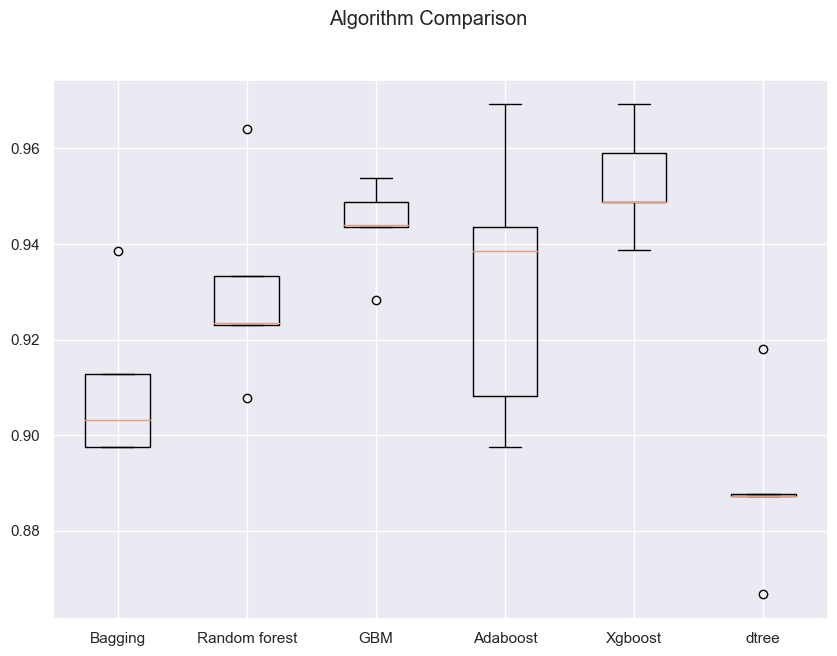

<IPython.core.display.Javascript object>

In [70]:
# Plotting boxplots for CV scores of all models defined above
fig = plt.figure()

fig.suptitle("Algorithm Comparison")
ax = fig.add_subplot(111)

plt.boxplot(results)
ax.set_xticklabels(names)

plt.show()

- We can see that the Xgboost is giving the highest cross-validated recall followed by gbm
- The boxplot shows that the performance of xgboost & gbm is consistent and their performance on the validation set is also good.

**We will tune 3 of these models to evaluate their performance; xgboost, adaboost & gbm**
- We chose `xgboost` because it had the best performance in all the modelling we implemented i.e. normal, oversampling & undersampling
- `Adaboost, gbm & random forest` were the next best models from all the sampling we implemented
- `Adaboost and gbm` are chosen over `random forest` because of their benefit of reducing bias which is useful in classification problems.

### Hyperparameter Tuning

**First let's create two functions to calculate different metrics and confusion matrix, so that we don't have to use the same code repeatedly for each model.**

In [71]:
# defining a function to compute different metrics to check performance of a classification model built using sklearn
def model_performance_classification_sklearn(model, predictors, target):
    """
    Function to compute different metrics to check classification model performance

    model: classifier
    predictors: independent variables
    target: dependent variable
    """

    # predicting using the independent variables
    pred = model.predict(predictors)

    acc = accuracy_score(target, pred)  # to compute Accuracy
    recall = recall_score(target, pred)  # to compute Recall
    precision = precision_score(target, pred)  # to compute Precision
    f1 = f1_score(target, pred)  # to compute F1-score

    # creating a dataframe of metrics
    df_perf = pd.DataFrame(
        {
            "Accuracy": acc,
            "Recall": recall,
            "Precision": precision,
            "F1": f1,
        },
        index=[0],
    )

    return df_perf

<IPython.core.display.Javascript object>

In [72]:
def confusion_matrix_sklearn(model, predictors, target):
    """
    To plot the confusion_matrix with percentages

    model: classifier
    predictors: independent variables
    target: dependent variable
    """
    y_pred = model.predict(predictors)
    cm = confusion_matrix(target, y_pred)
    labels = np.asarray(
        [
            ["{0:0.0f}".format(item) + "\n{0:.2%}".format(item / cm.flatten().sum())]
            for item in cm.flatten()
        ]
    ).reshape(2, 2)

    plt.figure(figsize=(6, 4))
    sns.heatmap(cm, annot=labels, fmt="")
    plt.ylabel("True label")
    plt.xlabel("Predicted label")

<IPython.core.display.Javascript object>

#### Xgboost RandomizedSearchCV

In [73]:
%%time

# defining model
model = XGBClassifier(random_state=1,eval_metric='logloss')

# Parameter grid to pass in RandomizedSearchCV
param_grid={'n_estimators':np.arange(50,150,50),
            'scale_pos_weight':[2,5,10],
            'learning_rate':[0.01,0.1,0.2,0.05],
            'gamma':[0,1,3,5],
            'subsample':[0.8,0.9,1],
            'max_depth':np.arange(1,5,1),
            'reg_lambda':[5,10]}

# Type of scoring used to compare parameter combinations
scorer = metrics.make_scorer(metrics.recall_score)

#Calling RandomizedSearchCV
xgb_tuned = RandomizedSearchCV(estimator=model, param_distributions=param_grid, n_iter=50, scoring=scorer, cv=5, random_state=1, n_jobs = -1)

#Fitting parameters in RandomizedSearchCV
xgb_tuned.fit(X_train,y_train)

print("Best parameters are {} with CV score={}:" .format(xgb_tuned.best_params_,xgb_tuned.best_score_))

Best parameters are {'subsample': 0.8, 'scale_pos_weight': 10, 'reg_lambda': 10, 'n_estimators': 50, 'max_depth': 2, 'learning_rate': 0.1, 'gamma': 0} with CV score=0.9682260596546313:
CPU times: user 2.67 s, sys: 408 ms, total: 3.07 s
Wall time: 1min 26s


<IPython.core.display.Javascript object>

In [74]:
# building model with best parameters
xgb_tuned = XGBClassifier(
    random_state=1,
    n_estimators=50,
    scale_pos_weight=10,
    gamma=0,
    subsample=0.8,
    learning_rate=0.1,
    eval_metric="logloss",
    max_depth=2,
    reg_lambda=10,
)
# Fit the model on training data
xgb_tuned.fit(X_train, y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric='logloss',
              feature_types=None, gamma=0, gpu_id=None, grow_policy=None,
              importance_type=None, interaction_constraints=None,
              learning_rate=0.1, max_bin=None, max_cat_threshold=None,
              max_cat_to_onehot=None, max_delta_step=None, max_depth=2,
              max_leaves=None, min_child_weight=None, missing=nan,
              monotone_constraints=None, n_estimators=50, n_jobs=None,
              num_parallel_tree=None, predictor=None, random_state=1, ...)

<IPython.core.display.Javascript object>

In [75]:
# Calculating different metrics on train set
xgboost_random_train = model_performance_classification_sklearn(
    xgb_tuned, X_train, y_train
)
print("Training performance:")
xgboost_random_train

Training performance:


,Accuracy,Recall,Precision,F1
0,0.849,0.984,0.516,0.677


<IPython.core.display.Javascript object>

In [76]:
# Calculating different metrics on validation set
xgboost_random_val = model_performance_classification_sklearn(xgb_tuned, X_val, y_val)
print("Validation performance:")
xgboost_random_val

Validation performance:


,Accuracy,Recall,Precision,F1
0,0.846,0.966,0.512,0.670


<IPython.core.display.Javascript object>

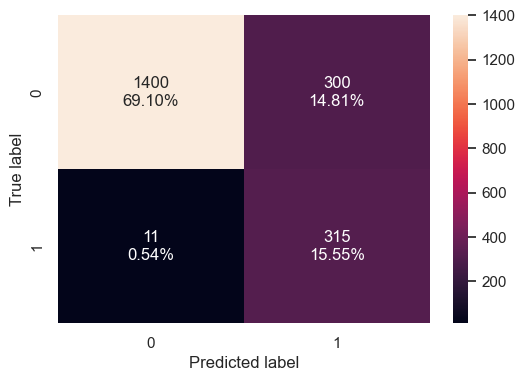

<IPython.core.display.Javascript object>

In [77]:
# creating confusion matrix
confusion_matrix_sklearn(xgb_tuned, X_val, y_val)

- The model is giving a generalised performance
- The model can also identify a good number of churners.

#### Adaboost RandomizedSearchCV

In [78]:
%%time 

# defining model
model = AdaBoostClassifier(random_state=1)

# Parameter grid to pass in GridSearchCV

param_grid = {
    "n_estimators": np.arange(10, 110, 10),
    "learning_rate": [0.1, 0.01, 0.2, 0.05, 1],
    "estimator": [
        DecisionTreeClassifier(max_depth=1, random_state=1),
        DecisionTreeClassifier(max_depth=2, random_state=1),
        DecisionTreeClassifier(max_depth=3, random_state=1),
    ],
}

# Type of scoring used to compare parameter combinations
scorer = metrics.make_scorer(metrics.recall_score)

#Calling RandomizedSearchCV
adb_tuned = RandomizedSearchCV(estimator=model, param_distributions=param_grid, n_jobs = -1, n_iter=50, scoring=scorer, cv=5, random_state=1)

#Fitting parameters in RandomizedSearchCV
adb_tuned.fit(X_train,y_train)

print("Best parameters are {} with CV score={}:" .format(adb_tuned.best_params_,adb_tuned.best_score_))

Best parameters are {'n_estimators': 90, 'learning_rate': 1, 'estimator': DecisionTreeClassifier(max_depth=2, random_state=1)} with CV score=0.8647409733124019:
CPU times: user 2.85 s, sys: 292 ms, total: 3.14 s
Wall time: 2min 16s


<IPython.core.display.Javascript object>

In [79]:
# building model with best parameters
adb_tuned = AdaBoostClassifier(
    n_estimators=90,
    learning_rate=1,
    random_state=1,
    estimator=DecisionTreeClassifier(max_depth=2, random_state=1),
)

# Fit the model on training data
adb_tuned.fit(X_train, y_train)

AdaBoostClassifier(estimator=DecisionTreeClassifier(max_depth=2,
                                                    random_state=1),
                   learning_rate=1, n_estimators=90, random_state=1)

<IPython.core.display.Javascript object>

In [80]:
# Calculating different metrics on train set
Adaboost_random_train = model_performance_classification_sklearn(
    adb_tuned, X_train, y_train
)
print("Training performance:")
Adaboost_random_train

Training performance:


,Accuracy,Recall,Precision,F1
0,0.995,0.980,0.990,0.985


<IPython.core.display.Javascript object>

In [81]:
# Calculating different metrics on validation set
Adaboost_random_val = model_performance_classification_sklearn(adb_tuned, X_val, y_val)
print("Validation performance:")
Adaboost_random_val

Validation performance:


,Accuracy,Recall,Precision,F1
0,0.967,0.868,0.922,0.894


<IPython.core.display.Javascript object>

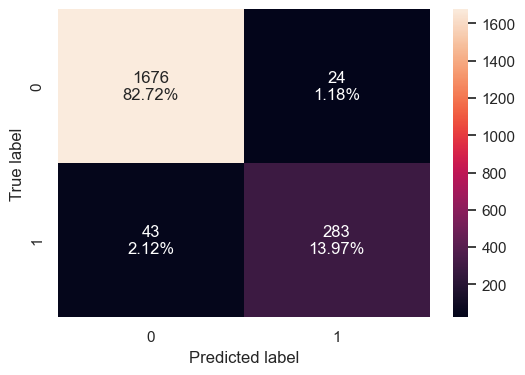

<IPython.core.display.Javascript object>

In [82]:
# creating confusion matrix
confusion_matrix_sklearn(adb_tuned, X_val, y_val)

- This model also seems to be generalising well
- It can also identify a good number of churners; though not as much as the tuned xgboost model.

#### Gradientboost RandomizedSearchCV

In [83]:
%%time

# Choose the type of classifier. 
model = GradientBoostingClassifier(init=AdaBoostClassifier(random_state=1),random_state=1)

# Parameter grid to pass in RandomizedSearchCV
parameters = {
    "n_estimators": [100,150,200,250],
    "subsample":[0.8,0.9,1],
    "max_features":[0.7,0.8,0.9,1]
}

# Type of scoring used to compare parameter combinations
scorer = metrics.make_scorer(metrics.recall_score)

#Calling RandomizedSearchCV
gbc_tuned = RandomizedSearchCV(estimator=model, param_distributions=parameters, scoring=scorer, cv=5, n_jobs=-1, n_iter=50, random_state=1)

# Fitting parameters in RandomizedSearchCV.
gbc_tuned.fit(X_train, y_train)

print("Best parameters are {} with CV score={}:" .format(gbc_tuned.best_params_,gbc_tuned.best_score_))

Best parameters are {'subsample': 0.9, 'n_estimators': 250, 'max_features': 0.8} with CV score=0.8606331763474622:
CPU times: user 6.44 s, sys: 430 ms, total: 6.87 s
Wall time: 5min 48s


<IPython.core.display.Javascript object>

In [84]:
# building model with best parameters
gbc_tuned = GradientBoostingClassifier(
    n_estimators=250,
    subsample=0.9,
    random_state=1,
    max_features=0.8,
    init=AdaBoostClassifier(random_state=1),
)

# Fit the model on training data
gbc_tuned.fit(X_train, y_train)

GradientBoostingClassifier(init=AdaBoostClassifier(random_state=1),
                           max_features=0.8, n_estimators=250, random_state=1,
                           subsample=0.9)

<IPython.core.display.Javascript object>

In [85]:
# Calculating different metrics on train set
Gradientboost_random_train = model_performance_classification_sklearn(
    gbc_tuned, X_train, y_train
)
print("Training performance:")
Gradientboost_random_train

Training performance:


,Accuracy,Recall,Precision,F1
0,0.989,0.955,0.977,0.966


<IPython.core.display.Javascript object>

In [86]:
# Calculating different metrics on validation set
Gradientboost_random_val = model_performance_classification_sklearn(
    gbc_tuned, X_val, y_val
)
print("Validation performance:")
Gradientboost_random_val

Validation performance:


,Accuracy,Recall,Precision,F1
0,0.974,0.896,0.942,0.918


<IPython.core.display.Javascript object>

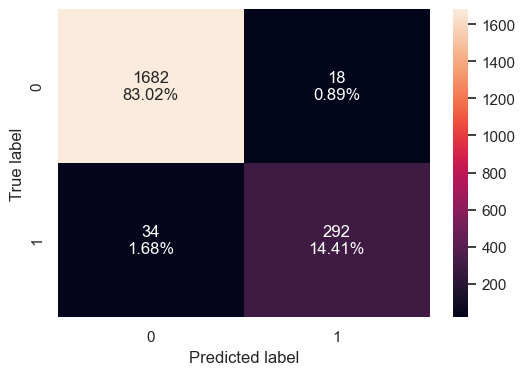

<IPython.core.display.Javascript object>

In [87]:
# creating confusion matrix
confusion_matrix_sklearn(gbc_tuned, X_val, y_val)

- The validation recall has increased by `~2.8%` as compared to the validation recall of the adaboost model
- The model is giving an overall generalised performance
- The model is also good at identifying churners slightly better than the adaboost model.

### Comparing all models

In [88]:
# training performance comparison

models_train_comp_df = pd.concat(
    [
        xgboost_random_train.T,
        Adaboost_random_train.T,
        Gradientboost_random_train.T,
    ],
    axis=1,
)
models_train_comp_df.columns = [
    "Xgboost Tuned with Random Search",
    "AdaBoost Tuned with Random search",
    "Gradientboost Tuned with Random search",
]
print("Training performance comparison:")
models_train_comp_df

Training performance comparison:


,Xgboost Tuned with Random Search,AdaBoost Tuned with Random search,Gradientboost Tuned with Random search
Accuracy,0.849,0.995,0.989
Recall,0.984,0.980,0.955
Precision,0.516,0.990,0.977
F1,0.677,0.985,0.966


<IPython.core.display.Javascript object>

In [89]:
# Validation performance comparison

models_val_comp_df = pd.concat(
    [
        xgboost_random_val.T,
        Adaboost_random_val.T,
        Gradientboost_random_val.T,
    ],
    axis=1,
)
models_val_comp_df.columns = [
    "Xgboost Tuned with Random Search",
    "AdaBoost Tuned with Random search",
    "Gradientboost Tuned with Random search",
]
print("Validation performance comparison:")
models_val_comp_df

Validation performance comparison:


,Xgboost Tuned with Random Search,AdaBoost Tuned with Random search,Gradientboost Tuned with Random search
Accuracy,0.846,0.967,0.974
Recall,0.966,0.868,0.896
Precision,0.512,0.922,0.942
F1,0.670,0.894,0.918


<IPython.core.display.Javascript object>

#### Performance on the test set

In [90]:
# Calculating xgboost metrics on the test set
xgboost_random_test = model_performance_classification_sklearn(
    xgb_tuned, X_test, y_test
)
print("Test performance:")
xgboost_random_test

Test performance:


,Accuracy,Recall,Precision,F1
0,0.846,0.975,0.510,0.670


<IPython.core.display.Javascript object>

In [91]:
# Calculating Adaboost metrics on the test set
Adaboost_random_test = model_performance_classification_sklearn(
    adb_tuned, X_test, y_test
)
print("Test performance:")
Adaboost_random_test

Test performance:


,Accuracy,Recall,Precision,F1
0,0.975,0.929,0.915,0.922


<IPython.core.display.Javascript object>

In [92]:
# Calculating Gradientboost metrics on the test set
Gradientboost_random_test = model_performance_classification_sklearn(
    gbc_tuned, X_test, y_test
)
print("Test performance:")
Gradientboost_random_test

Test performance:


,Accuracy,Recall,Precision,F1
0,0.979,0.923,0.943,0.933


<IPython.core.display.Javascript object>

**The best model objective is to achieve Recall `> ~0.95` and Precision and Accuracy `> ~0.70` on the test set**

- The xgboost model tuned using Random search is giving the best validation recall of `~0.96` but it has a low values of train & validation precision and a test precision `< ~0.70`
- Due to this we select the `gradientboost model` which has a test recall of `~0.92` and the best test precision & accuracy
- Let's check the model's performance on test set and then see the feature importance from the tuned gradientboost model.

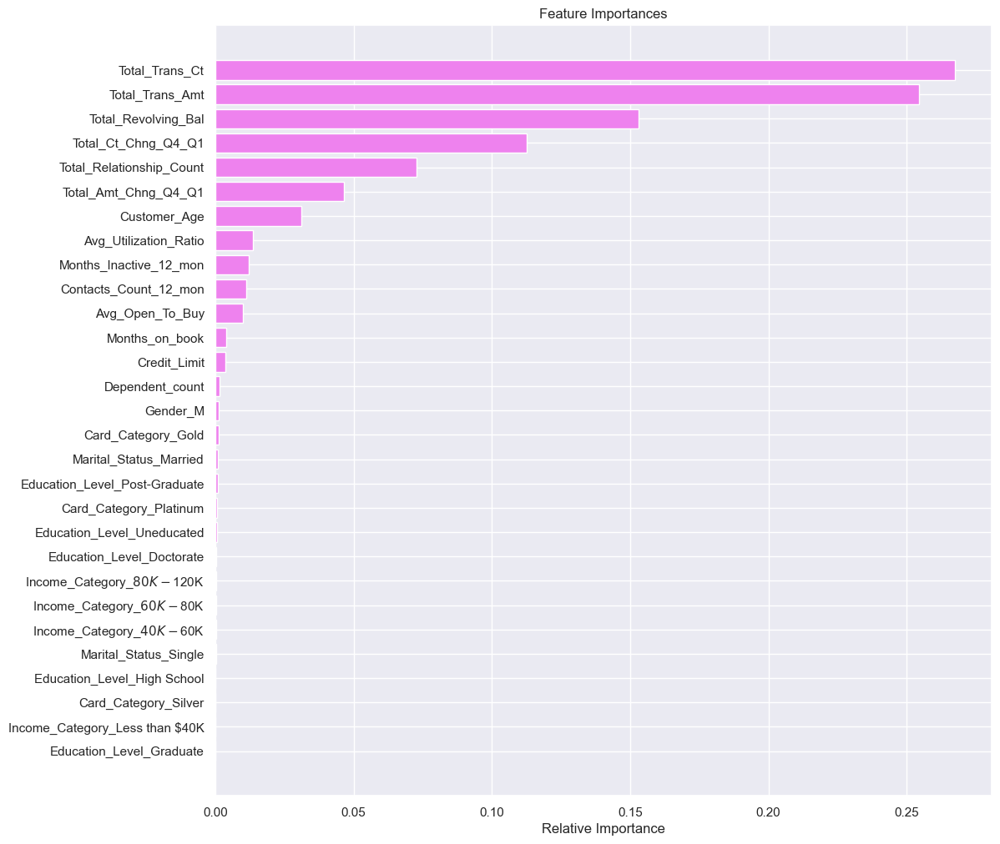

<IPython.core.display.Javascript object>

In [93]:
feature_names = X.columns
importances = gbc_tuned.feature_importances_
indices = np.argsort(importances)

plt.figure(figsize=(12, 12))
plt.title("Feature Importances")
plt.barh(range(len(indices)), importances[indices], color="violet", align="center")
plt.yticks(range(len(indices)), [feature_names[i] for i in indices])
plt.xlabel("Relative Importance")
plt.show()

- `Total_Trans_Ct` is the most important feature in determining whether a customer would churn
- This is followed by Total_Trans_Amt, Total_Revolving_Bal, Total_Ct_Chng_Q4_Q1, Total_Relationship_Count & Total_Amt_Chng_Q4_Q1.

## Pipelines for productionizing the model
- Now, we have a final model. let's use pipelines to put the model into production



## Column Transformer
- We know that we can use pipelines to standardize the model building, but the steps in a pipeline are applied to each and every variable - how can we personalize the pipeline to perform different processing on different columns
- Column transformer allows different columns or column subsets of the input to be transformed separately and the features generated by each transformer will be concatenated to form a single feature space. This is useful for heterogeneous or columnar data, to combine several feature extraction mechanisms or transformations into a single transformer.

- We will create 2 different pipelines, one for numerical columns and one for categorical columns
- For numerical columns, we will do missing value imputation as pre-processing
- For categorical columns, we will do one hot encoding and missing value imputation as pre-processing
- We are doing missing value imputation for the whole data, so that if there is any missing value in the data in future that can be taken care of.

In [94]:
# creating a list of numerical variables
numerical_features = [
    "Customer_Age",
    "Dependent_count",
    "Months_on_book",
    "Total_Relationship_Count",
    "Months_Inactive_12_mon",
    "Contacts_Count_12_mon",
    "Credit_Limit",
    "Total_Revolving_Bal",
    "Avg_Open_To_Buy",
    "Total_Amt_Chng_Q4_Q1",
    "Total_Trans_Amt",
    "Total_Trans_Ct",
    "Total_Ct_Chng_Q4_Q1",
    "Avg_Utilization_Ratio",
]

# creating a transformer for numerical variables, which will apply simple imputer on the numerical variables
numeric_transformer = Pipeline(steps=[("imputer", SimpleImputer(strategy="median"))])


# creating a list of categorical variables
categorical_features = [
    "Gender",
    "Education_Level",
    "Marital_Status",
    "Income_Category",
    "Card_Category",
]

# creating a transformer for categorical variables, which will first apply simple imputer and
# then do one hot encoding for categorical variables
categorical_transformer = Pipeline(
    steps=[
        ("imputer", SimpleImputer(strategy="most_frequent")),
        ("onehot", OneHotEncoder(handle_unknown="ignore")),
    ]
)
# handle_unknown = "ignore", allows model to handle any unknown category in the test data

# combining categorical transformer and numerical transformer using a column transformer

preprocessor = ColumnTransformer(
    transformers=[
        ("num", numeric_transformer, numerical_features),
        ("cat", categorical_transformer, categorical_features),
    ],
    remainder="passthrough",
)
# remainder = "passthrough" has been used, it will allow variables that are present in original data
# but not in "numerical_columns" and "categorical_columns" to pass through the column transformer without any changes

<IPython.core.display.Javascript object>

In [95]:
# Separating target variable and other variables
X = data.drop(columns="Attrition_Flag")
Y = data["Attrition_Flag"]

<IPython.core.display.Javascript object>

- Now we already know the best model we need to process with, so we don't need to divide data into 3 parts.

In [96]:
# Splitting the data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(
    X, Y, test_size=0.30, random_state=1, stratify=Y
)
print(X_train.shape, X_test.shape)

(7088, 19) (3039, 19)


<IPython.core.display.Javascript object>

In [97]:
# Creating new pipeline with best parameters
model = Pipeline(
    steps=[
        ("pre", preprocessor),
        (
            "GBC",
            GradientBoostingClassifier(
                n_estimators=250,
                subsample=0.9,
                random_state=1,
                max_features=0.8,
                init=AdaBoostClassifier(random_state=1),
            ),
        ),
    ]
)
# Fit the model on training data
model.fit(X_train, y_train)

Pipeline(steps=[('pre',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('num',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='median'))]),
                                                  ['Customer_Age',
                                                   'Dependent_count',
                                                   'Months_on_book',
                                                   'Total_Relationship_Count',
                                                   'Months_Inactive_12_mon',
                                                   'Contacts_Count_12_mon',
                                                   'Credit_Limit',
                                                   'Total_Revolving_Bal',
                                                   'Avg_Open_To_Buy',
                                                   'Total_Amt_Chng_Q4_...
                                                 ('cat',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='most_frequent')),
                                                                  ('onehot',
                                                                   OneHotEncoder(handle_unknown='ignore'))]),
                                                  ['Gender', 'Education_Level',
                                                   'Marital_Status',
                                                   'Income_Category',
                                                   'Card_Category'])])),
                ('GBC',
                 GradientBoostingClassifier(init=AdaBoostClassifier(random_state=1),
                                            max_features=0.8, n_estimators=250,
                                            random_state=1, subsample=0.9))])

<IPython.core.display.Javascript object>

## Business Insights & Recommendations

- The best test recall is `~92%` and test precision of `~94%`. This indicates that the model is good at identifying both churners and non-churners.
- The model performance can be improved in terms of test recall by applying the undersampled model
- Customers who are most likely to churn should be surveyed to understand their reason in order to match their lifestyle needs with a credit strategy
- Customers with `<= 3` products should be targeted to increase the products they hold in order to reduce their likelihood of churning
- Customers with low credit should be targeted with interest rates that suit their income/credit limit to reduce their likelihood of churning
- Similarly customers with low revolving balance should be targeted with interest rates that suit their income/credit limit to reduce their likelihood of churning
- Customers with low transaction amount in the last 12 months should be surveyed to understand their reason & targeted with interest rates that suit their income/credit limit to reduce their likelihood of churning
- Similarly customers with low transaction count in the last 12 months should be surveyed to understand their reason & targeted with interest rates that suit their income/credit limit to reduce their likelihood of churning.